# FeatureMAP on CD8 T cell data.

In [1]:

import warnings
import numpy as np
# import pandas as pd
import scanpy as sc
import scipy

import featuremap

sc.logging.print_header()
sc.settings.set_figure_params(dpi=120, facecolor='white')

warnings.simplefilter("ignore", category=UserWarning)
warnings.simplefilter("ignore", category=FutureWarning)

/Users/uqyyao4/opt/anaconda3/envs/featmap/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


scanpy==1.9.8 anndata==0.10.5.post1 umap==0.5.4 numpy==1.23.5 scipy==1.12.0 pandas==2.2.1 scikit-learn==1.2.2 statsmodels==0.14.0 igraph==0.11.4 louvain==0.8.0 pynndescent==0.5.11


## FeatureMAP on exhausted CD8+ T cells
1. GEX and GVA visualization
2. Transition and core states indentification.
3. DGV to indentify important genes
4. Gene contribution visualization


## Data loading


In [2]:
adata = sc.read('/Users/uqyyao4/Library/CloudStorage/OneDrive-TheUniversityofQueensland/project/FeatureMAP_rev/data/CD8_exhaustion/CD8_exhaustion_cl13.h5ad')


## FeatureMAP GEX and GVA visualization

GEX embedding

In [ ]:
# preprocess data for featuremap
data = adata.X.copy()
emb_svd, vh = featuremap._preprocess_data(data)

Performing SVD decomposition on the data


FeatureMAP(random_state=42, verbose=True)
Fri Dec 20 15:56:42 2024 Construct fuzzy simplicial set
Fri Dec 20 15:56:42 2024 Finding Nearest Neighbors
Fri Dec 20 15:56:42 2024 Building RP forest with 10 trees
Fri Dec 20 15:56:45 2024 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	 4  /  14
	Stopping threshold met -- exiting after 4 iterations
Fri Dec 20 15:56:56 2024 Finished Nearest Neighbor Search
Fri Dec 20 15:56:58 2024 Construct embedding
Fri Dec 20 15:56:59 2024 Computing tangent space
Fri Dec 20 15:57:18 2024 Local SVD time is 18.58963680267334
Fri Dec 20 15:57:18 2024 Average over 42 times
Fri Dec 20 15:58:24 2024 Average time is 65.72773504257202
Fri Dec 20 15:58:24 2024 Tangent_space_approximation time is 84.9660530090332
k is 13
Fri Dec 20 15:58:37 2024 Tangent space embedding
Fri Dec 20 15:58:37 2024 Start optimizing layout


Epochs completed: 100%| ██████████ 400/400 [01:25]


Fri Dec 20 16:00:03 2024 Optimize layout time is 85.96051931381226
Fri Dec 20 16:00:03 2024 Finished embedding
mu is not added to adata


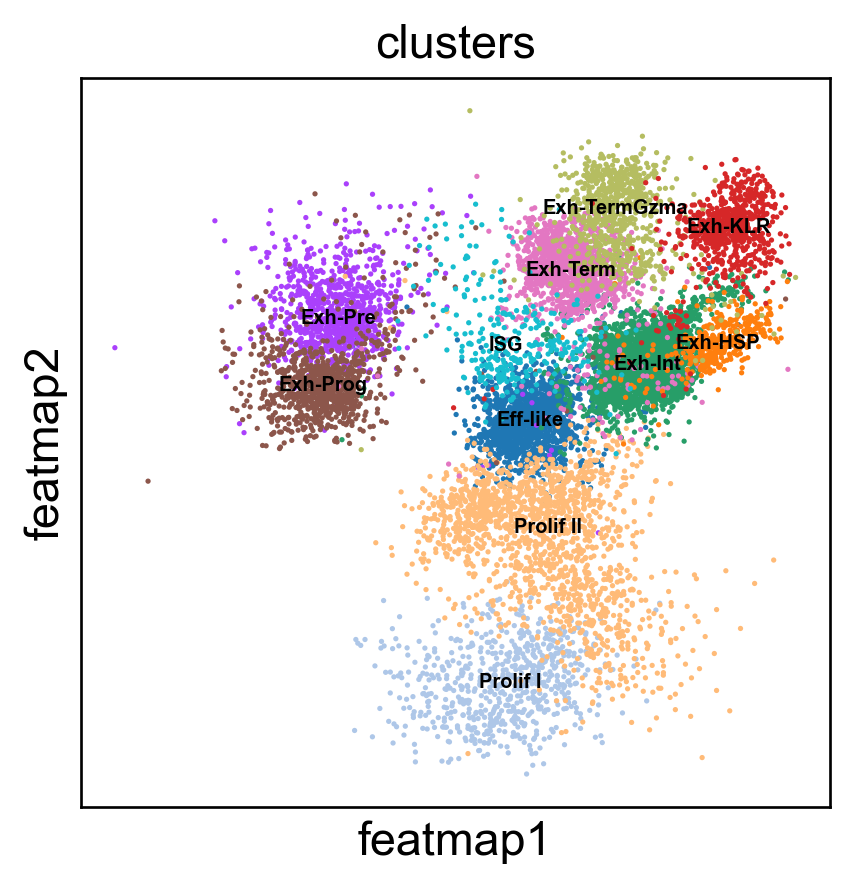

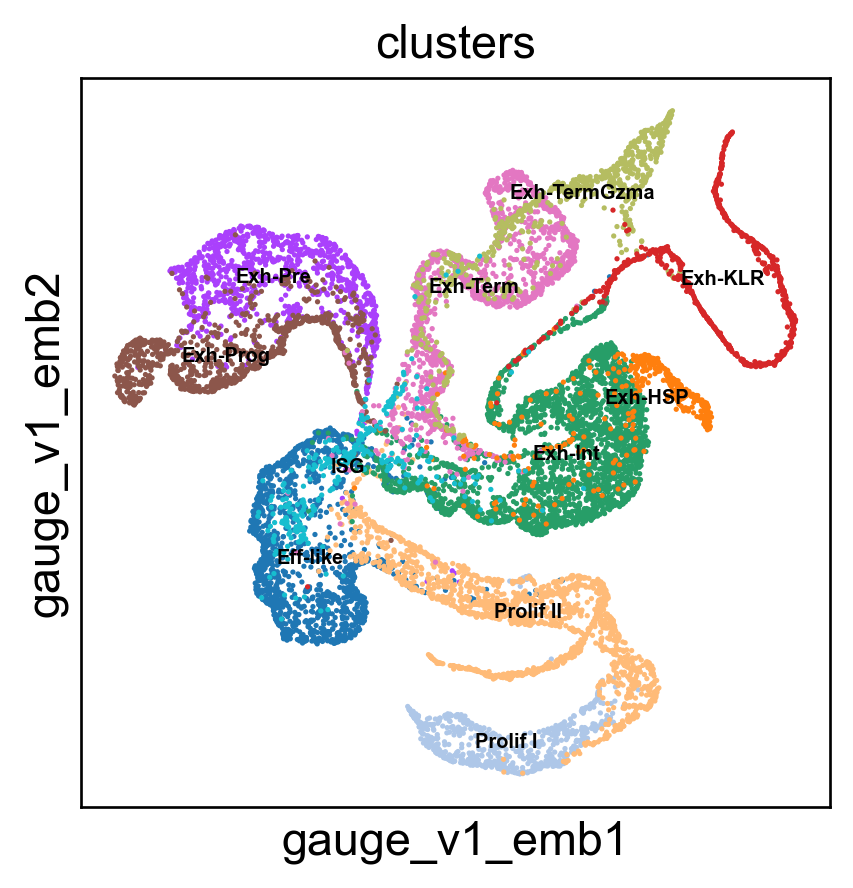

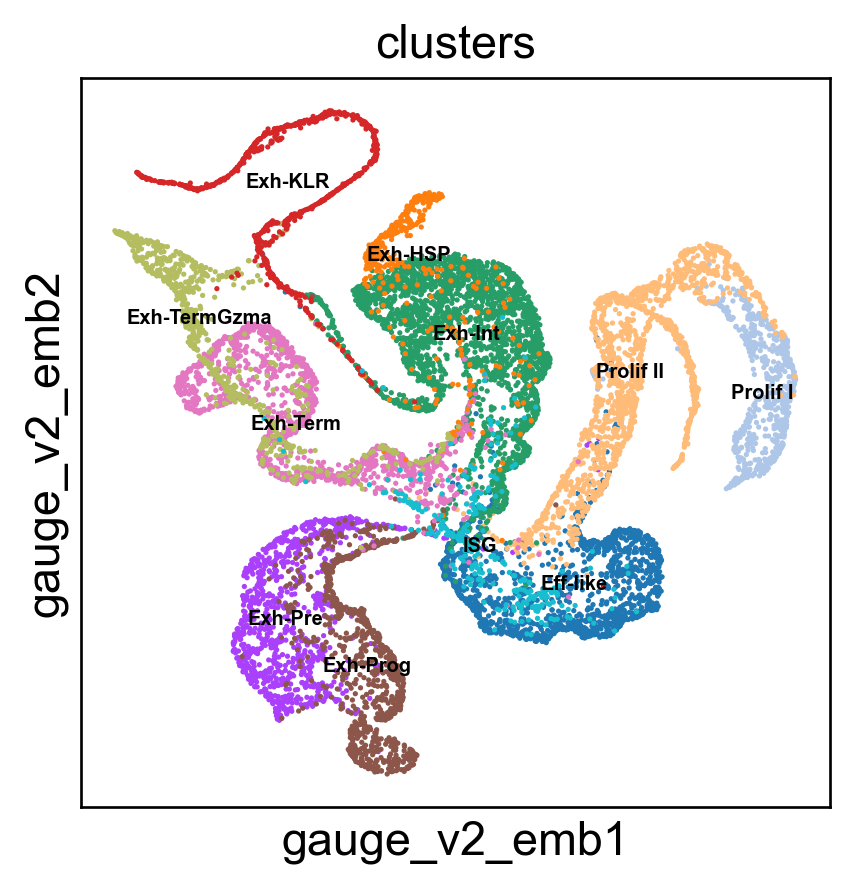

In [ ]:

emb_featuremap = featuremap.FeatureMAP(
                    random_state=42,
                    output_variation=False,
                    # output_feat=True,
                    verbose=True,
                    ).fit(emb_svd)

# create adata object
from featuremap import features
import importlib
importlib.reload(features)

adata = features.create_adata(X=adata.X, emb_featuremap=emb_featuremap, obs=adata.obs, var=adata.var)
adata.obsm['X_svd'] = emb_svd
adata.varm['svd_vh'] = vh.T

sc.pl.embedding(adata, 'featmap',legend_fontsize=6, s=10, legend_loc='on data', color=['clusters'])
sc.pl.embedding(adata, 'gauge_v1_emb',legend_fontsize =6, s=10,legend_loc='on data', color=['clusters'])
sc.pl.embedding(adata, 'gauge_v2_emb',legend_fontsize =6,s=10, legend_loc='on data', color=['clusters'])


GVA embedding

FeatureMAP(min_dist=0.3, output_variation=True, random_state=42, verbose=True)
Fri Dec 20 16:00:04 2024 Construct fuzzy simplicial set
Fri Dec 20 16:00:04 2024 Finding Nearest Neighbors
Fri Dec 20 16:00:04 2024 Building RP forest with 10 trees
Fri Dec 20 16:00:04 2024 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	 4  /  14
	Stopping threshold met -- exiting after 4 iterations
Fri Dec 20 16:00:05 2024 Finished Nearest Neighbor Search
Fri Dec 20 16:00:05 2024 Construct embedding
Fri Dec 20 16:00:06 2024 Computing tangent space
Fri Dec 20 16:00:18 2024 Local SVD time is 12.02213191986084
Fri Dec 20 16:00:18 2024 Average over 42 times
Fri Dec 20 16:01:34 2024 Average time is 76.42727303504944
Fri Dec 20 16:01:35 2024 Tangent_space_approximation time is 89.0467758178711
k is 13
Fri Dec 20 16:01:49 2024 Variation_embedding time is 14.374758958816528
Fri Dec 20 16:01:49 2024 Finished embedding


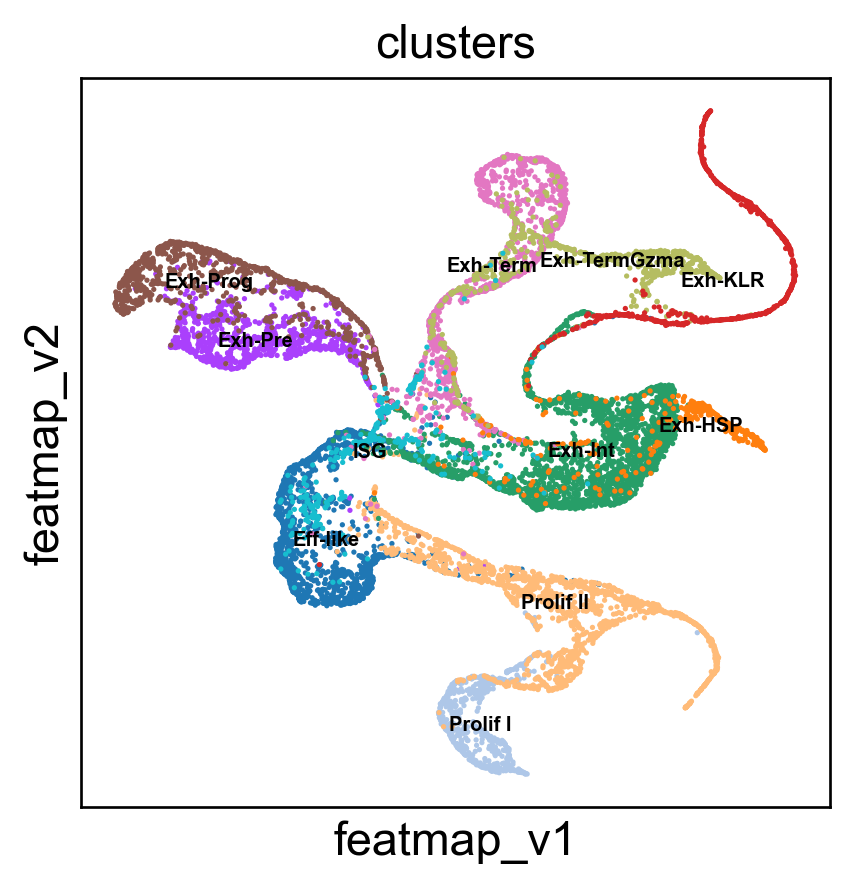

In [5]:
# Variation embedding

emb_featuremap_v = featuremap.FeatureMAP(random_state=42,output_variation=True,threshold=0.9, min_dist=0.3, verbose=True).fit(emb_svd)

adata.obsm['X_featmap_v'] = emb_featuremap_v.embedding_
sc.pl.embedding(adata, 'featmap_v',legend_fontsize=6, s=10, legend_loc='on data', color=['clusters'])

adata.obsm['variation_pc'] = emb_featuremap_v._featuremap_kwds['variation_pc']


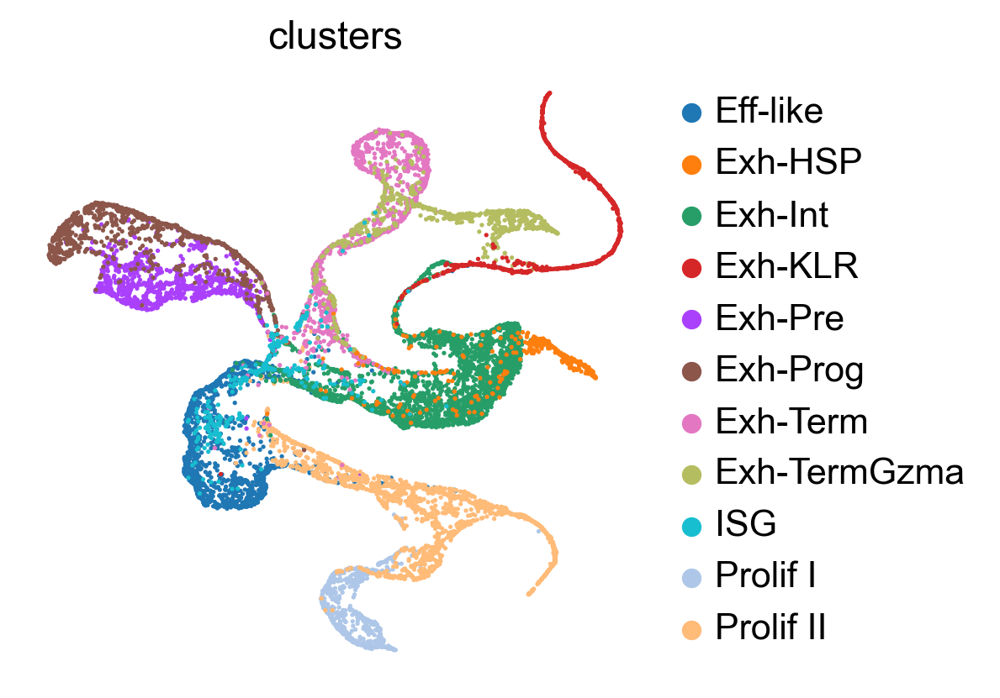

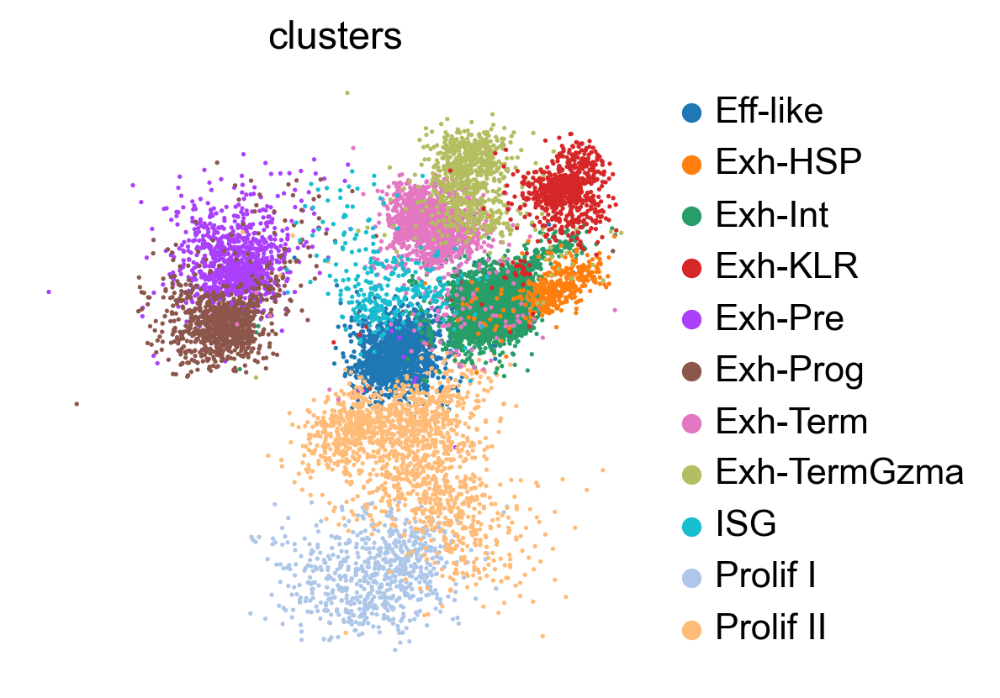

In [6]:
sc.pl.embedding(adata, 'featmap_v', color=['clusters'], frameon=False, )
sc.pl.embedding(adata, 'featmap', color=['clusters'], frameon=False, )

3D embedding

In [7]:
data = adata.X.copy()
from featuremap import featuremap
emb_featuremap_3d = featuremap.FeatureMAP(n_components=3,random_state=42,output_variation=True, verbose=True).fit_transform(emb_svd)

adata.obsm['X_featmap_v_3d'] = emb_featuremap_3d


FeatureMAP(n_components=3, output_variation=True, random_state=42, verbose=True)
Fri Dec 20 16:01:51 2024 Construct fuzzy simplicial set
Fri Dec 20 16:01:51 2024 Finding Nearest Neighbors
Fri Dec 20 16:01:51 2024 Building RP forest with 10 trees
Fri Dec 20 16:01:51 2024 NN descent for 14 iterations
	 1  /  14
	 2  /  14
	 3  /  14
	 4  /  14
	Stopping threshold met -- exiting after 4 iterations
Fri Dec 20 16:01:52 2024 Finished Nearest Neighbor Search
Fri Dec 20 16:01:52 2024 Construct embedding
Fri Dec 20 16:01:53 2024 Computing tangent space
Fri Dec 20 16:02:06 2024 Local SVD time is 13.328882217407227
Fri Dec 20 16:02:06 2024 Average over 42 times
Fri Dec 20 16:03:26 2024 Average time is 79.52464413642883
Fri Dec 20 16:03:26 2024 Tangent_space_approximation time is 93.8230471611023
k is 13
Fri Dec 20 16:03:48 2024 Variation_embedding time is 21.896079778671265
Fri Dec 20 16:03:48 2024 Finished embedding


In [ ]:
# 3D featuremap
from featuremap import features
import importlib
importlib.reload(features)

features.featuremap_var_3d(emb_featuremap_3d, color=adata.obs['clusters'])

Benchmark with other visualization methods, including UMAP, PHATE, t-SNE, densMAP.

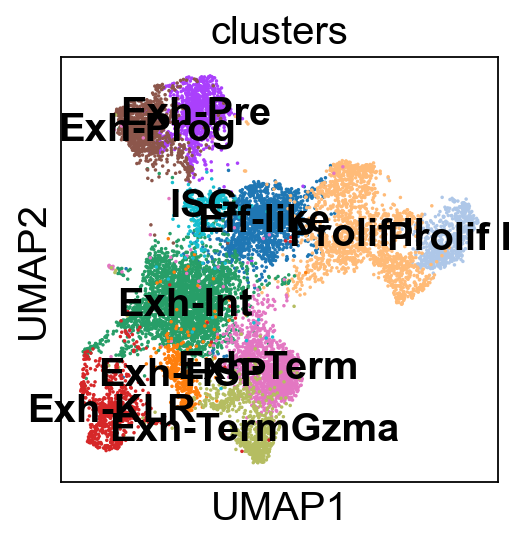

In [107]:
import umap

emb_umap = umap.UMAP(n_neighbors=30,  min_dist=0.3).fit_transform(emb_svd)
adata.obsm['X_umap'] = emb_umap
sc.pl.embedding(adata, basis='umap', color='clusters', legend_loc='on data')

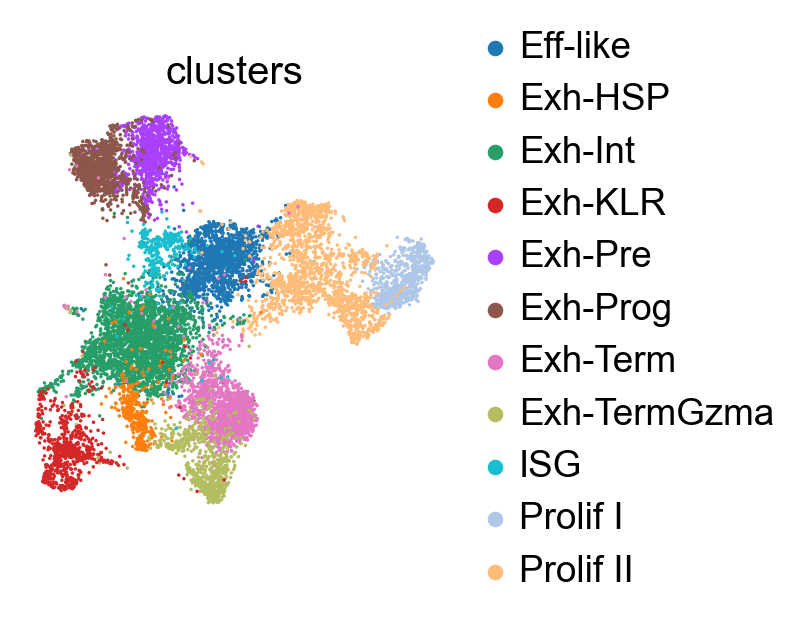

In [108]:
sc.pl.embedding(adata, basis='umap', color='clusters', frameon=False)

PHATE embedding.

Running PHATE on 11951 observations and 14577 variables.
Calculating graph and diffusion operator...
  Calculating PCA...
  Calculated PCA in 1478.45 seconds.
  Calculating KNN search...
  Calculated KNN search in 18.21 seconds.
  Calculating affinities...
  Calculated affinities in 0.59 seconds.
Calculated graph and diffusion operator in 1497.29 seconds.
Calculating landmark operator...
  Calculating SVD...
  Calculated SVD in 1.58 seconds.
  Calculating KMeans...
  Calculated KMeans in 19.83 seconds.
Calculated landmark operator in 22.65 seconds.
Calculating optimal t...
  Automatically selected t = 31
Calculated optimal t in 19.33 seconds.
Calculating diffusion potential...
Calculated diffusion potential in 37.20 seconds.
Calculating metric MDS...
Calculated metric MDS in 5.62 seconds.


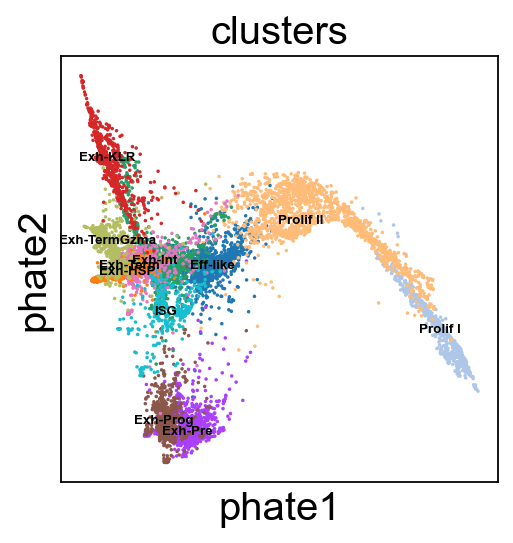

In [ ]:
# PHATE embedding
import phate
data = adata.X.copy()
phate_op = phate.PHATE()
phate_op.fit(data)
adata.obsm['X_phate'] = phate_op.transform(data)

sc.pl.embedding(adata, 'phate',legend_fontsize=6, s=10, legend_loc='on data', color=['clusters'])

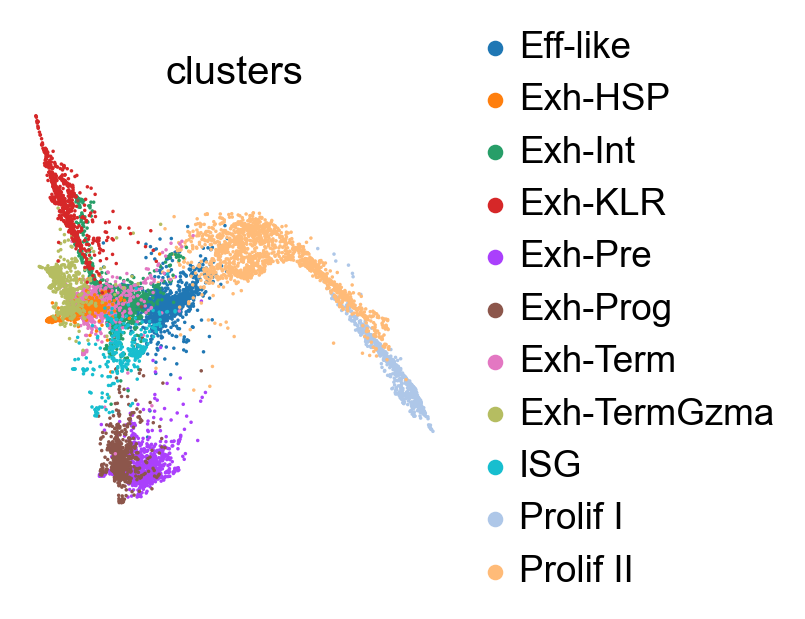

In [110]:
sc.pl.embedding(adata, 'phate', color=['clusters'], frameon=False, )

In [111]:
# PHATE graph for clustering coefficients.
phate_op = phate.PHATE()
emb_phate_obj = phate_op.fit(emb_svd)
phate_graph = emb_phate_obj.graph.to_igraph()
# number of nodes
print(phate_graph.vcount())
# to networkx
phate_graph_nx = phate_graph.to_networkx()

Running PHATE on 11951 observations and 100 variables.
Calculating graph and diffusion operator...
  Calculating KNN search...
  Calculated KNN search in 17.87 seconds.
  Calculating affinities...
  Calculated affinities in 0.38 seconds.
Calculated graph and diffusion operator in 18.28 seconds.
Calculating landmark operator...
  Calculating SVD...
  Calculated SVD in 1.54 seconds.
  Calculating KMeans...
  Calculated KMeans in 16.26 seconds.
Calculated landmark operator in 18.84 seconds.
11951


t-SNE embedding.

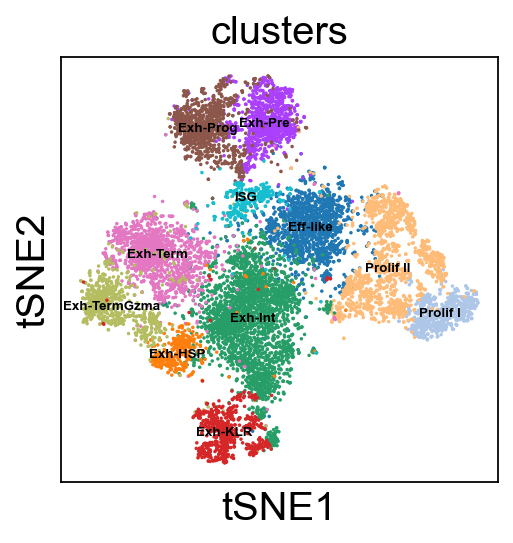

In [112]:
import seaborn as sns
import matplotlib.pyplot as plt

# t-SNE plot
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2)
emb_tsne = tsne.fit_transform(emb_svd)

adata.obsm['X_tsne'] = emb_tsne

sc.pl.embedding(adata, 'tsne',legend_fontsize=6, s=10, legend_loc='on data', color=['clusters'])




In [113]:
# kNN graph with k=30
from sklearn.neighbors import kneighbors_graph
knn_graph = kneighbors_graph(emb_svd, n_neighbors=30, mode='connectivity', include_self=False)

tsne_graph = knn_graph


densMAP embedding.

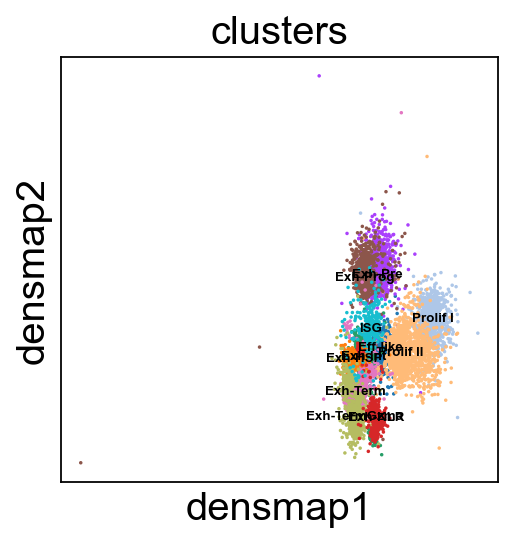

In [114]:
# densMAP plot
import umap
emb_densmap = umap.UMAP(n_neighbors=30, min_dist=0.3, densmap=True).fit(emb_svd)

adata.obsm['X_densmap'] = emb_densmap.embedding_

sc.pl.embedding(adata, 'densmap',legend_fontsize=6, s=10, legend_loc='on data', color=['clusters']) 


densmap_graph = emb_densmap.graph_

Compute pseudotime on variation space.

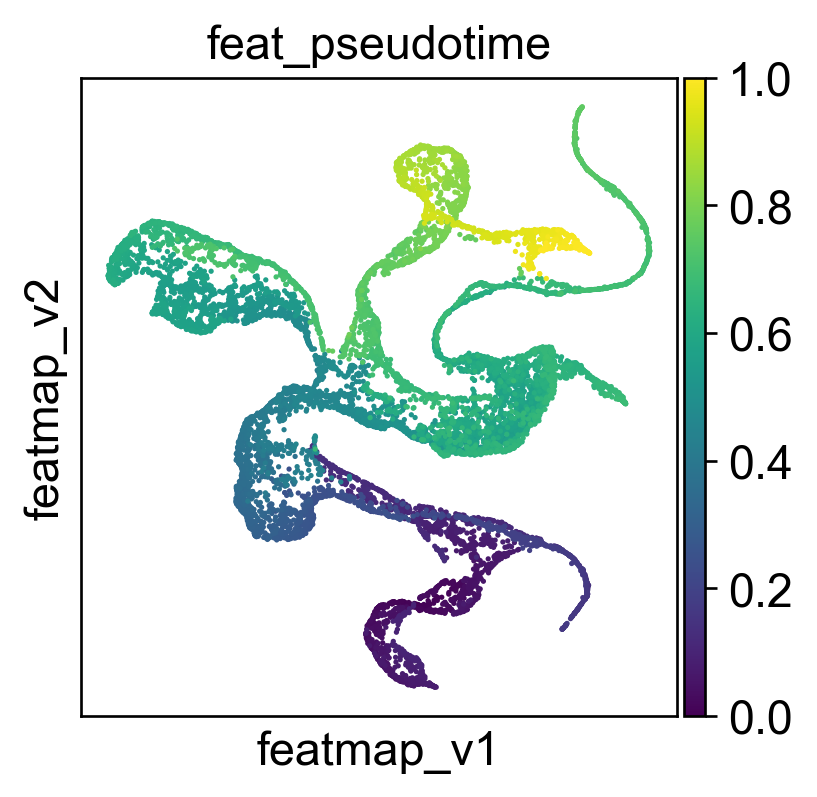

In [132]:
# FeatureMAP pseudo-time
from featuremap import features
import importlib
importlib.reload(features)

# Starting point index
# Randomly select a starting point from cluster "Ng3 low EP"
start_point_index = np.where(adata.obs['clusters'] == 'Prolif I')[0][0]
features.pseudotime_mst(adata, random_state=42, start_point_index=start_point_index)

sc.pl.embedding(adata, 'featmap_v',legend_fontsize=10, s=10, color=['feat_pseudotime'])

In [18]:
features.featuremap_var_3d(emb_featuremap_3d, color=adata.obs['feat_pseudotime'])

## Transition and core states identification by density, curvature and betweenness centrality.

Define transition and core states by density.

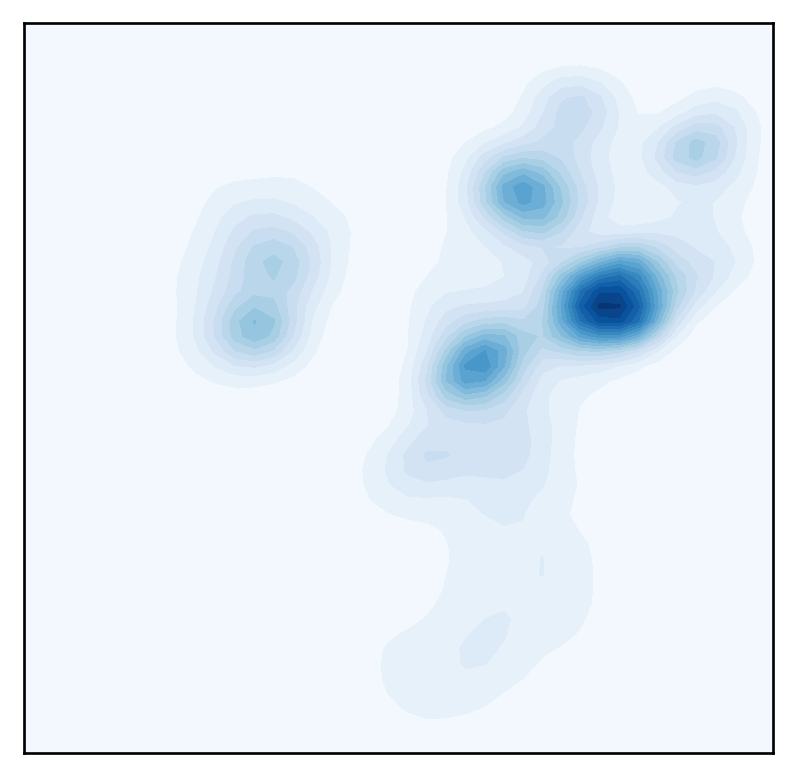

<Figure size 480x480 with 0 Axes>

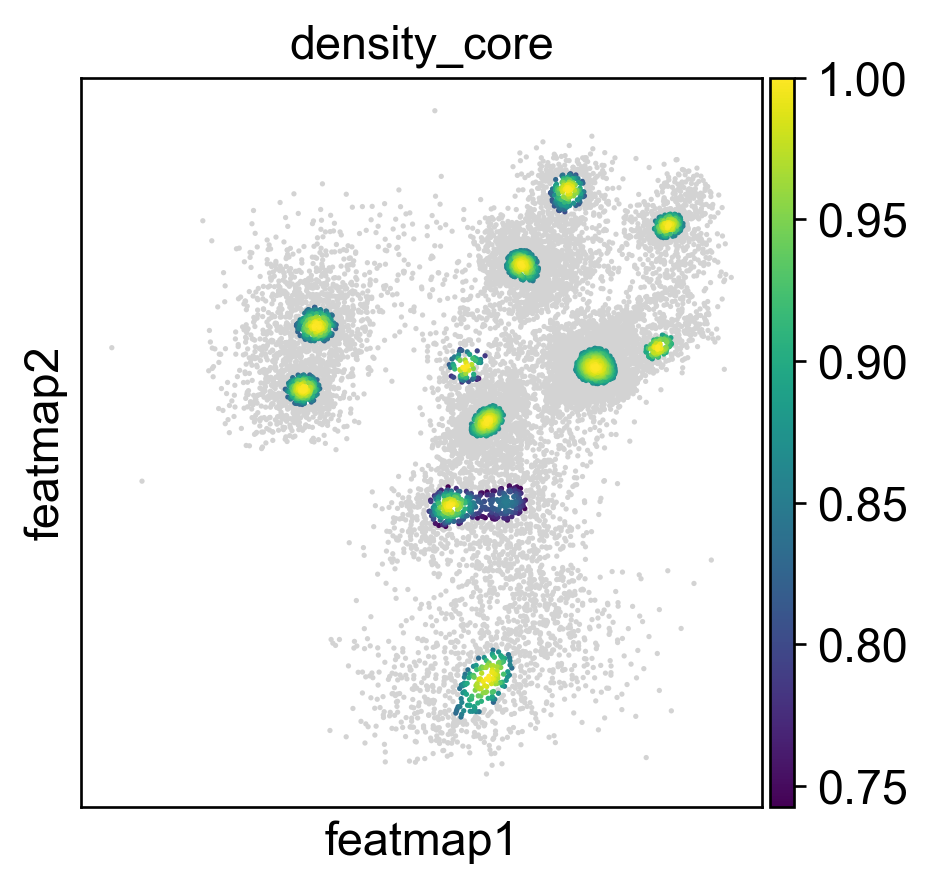

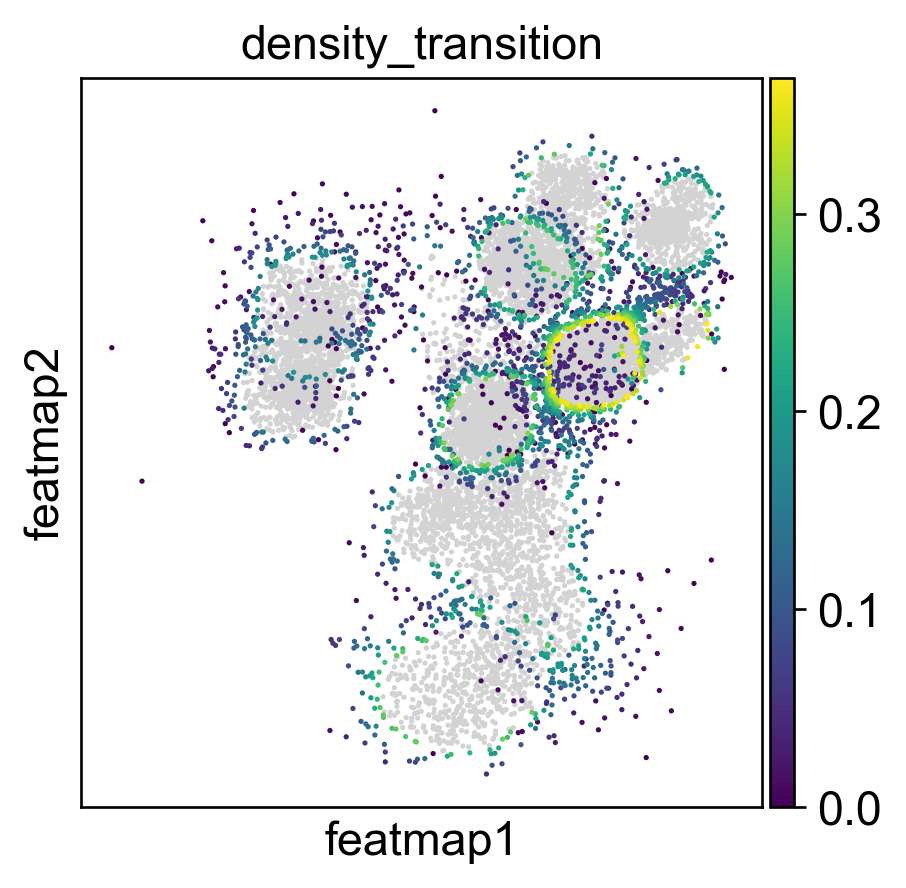

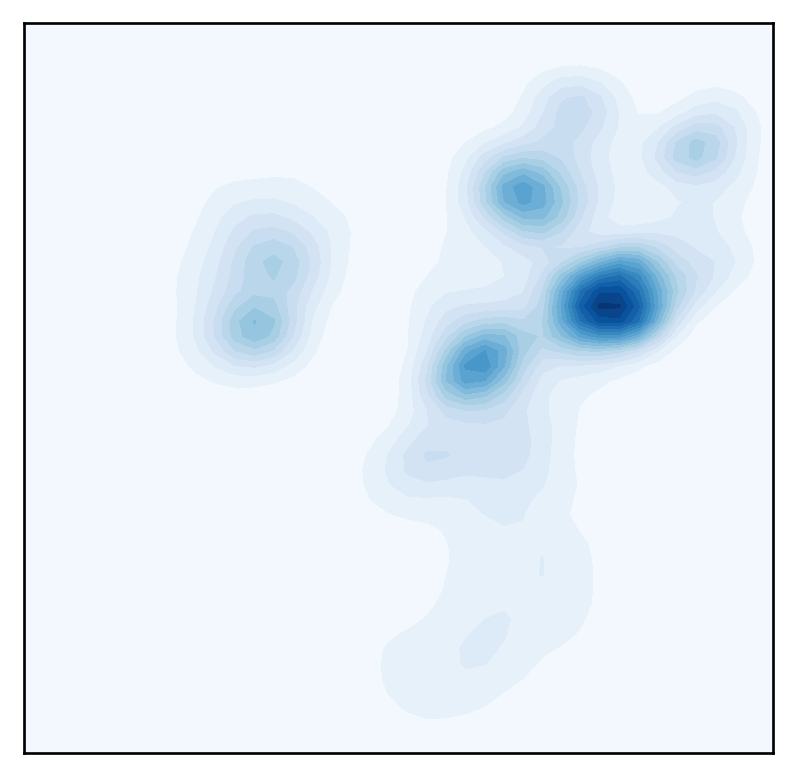

<Figure size 480x480 with 0 Axes>

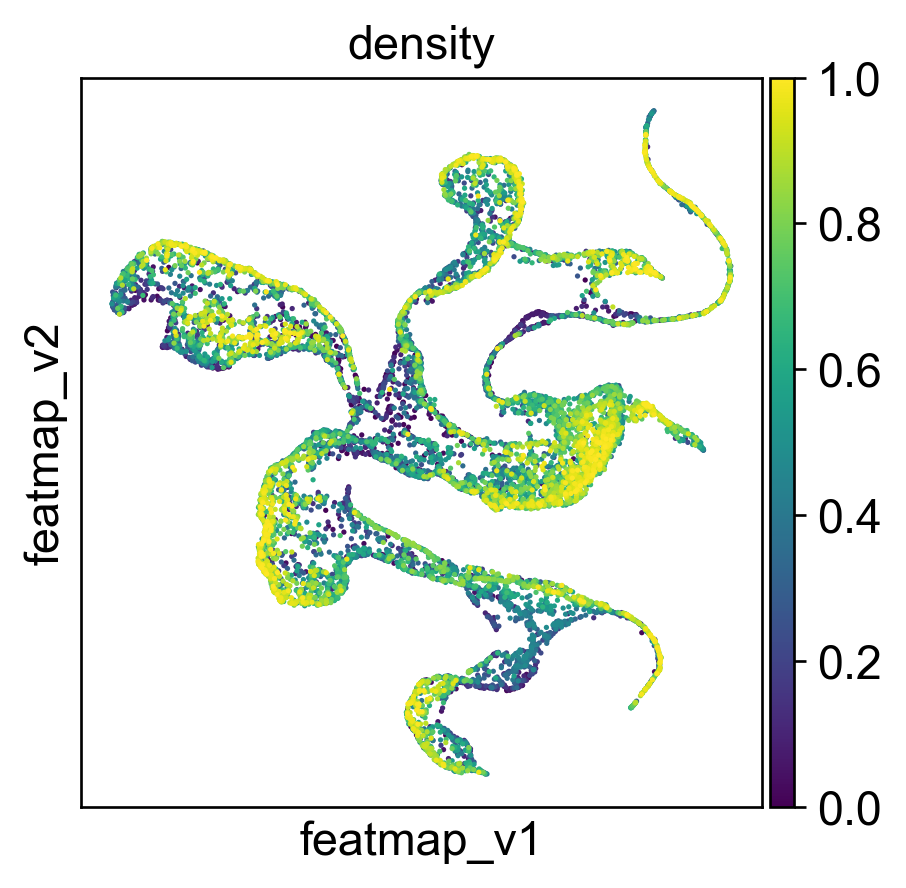

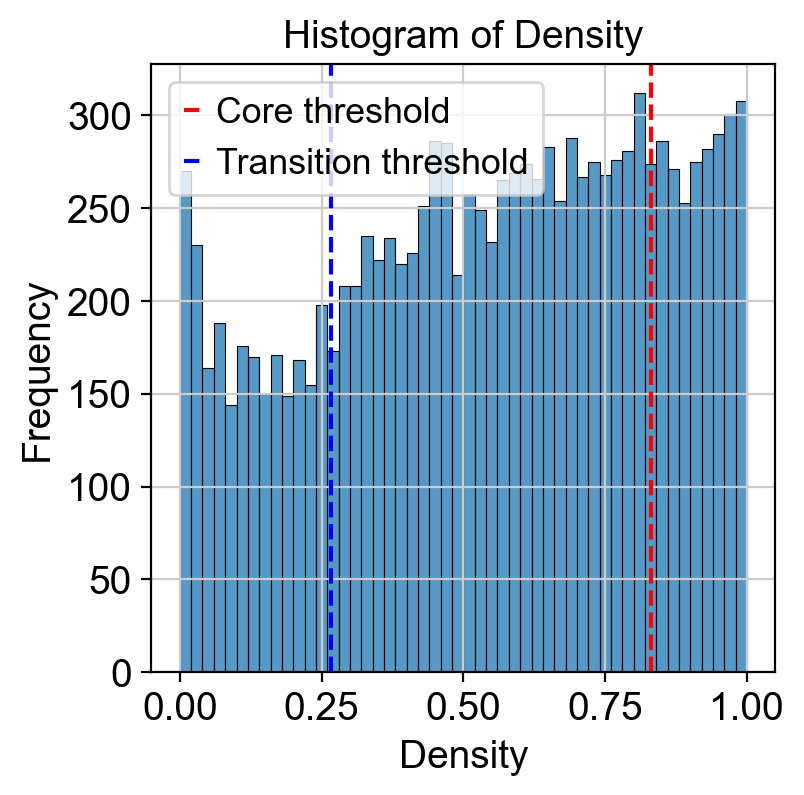

In [12]:
##################################
# Contour plot to show the density
######################################
from featuremap import core_transition_states
import importlib
importlib.reload(core_transition_states)

from featuremap.core_transition_states import plot_density
plot_density(adata)


#%%
#######################################################
# Compute core-states based on clusters
#########################################################
quantile_core = 0.8
quantile_trans = 0.2


from featuremap.core_transition_states import compute_density
compute_density(adata, quantile_core=quantile_core, quantile_trans=quantile_trans, cluster_key='clusters')  

plot_density(adata)


# import scanpy as sc
# sc.pl.embedding(adata, basis='X_featmap_v', color='core_trans_states',  )
sc.pl.embedding(adata, 'featmap_v',legend_fontsize=6, s=10, legend_loc='on data', color='density')

# plot histogram of density
import seaborn as sns
import matplotlib.pyplot as plt

density = adata.obs['density']

plt.figure(dpi=100)
sns.histplot(density, bins=50)
plt.xlabel('Density')
plt.ylabel('Frequency')
plt.title('Histogram of Density')
threshold_core = density.quantile(quantile_core)
plt.axvline(threshold_core, color='red', linestyle='--', label='Core threshold')

threshold_trans = density.quantile(quantile_trans)
plt.axvline(threshold_trans, color='blue', linestyle='--', label='Transition threshold')
plt.legend()

plt.show()




Identify transition and core states by curvature.

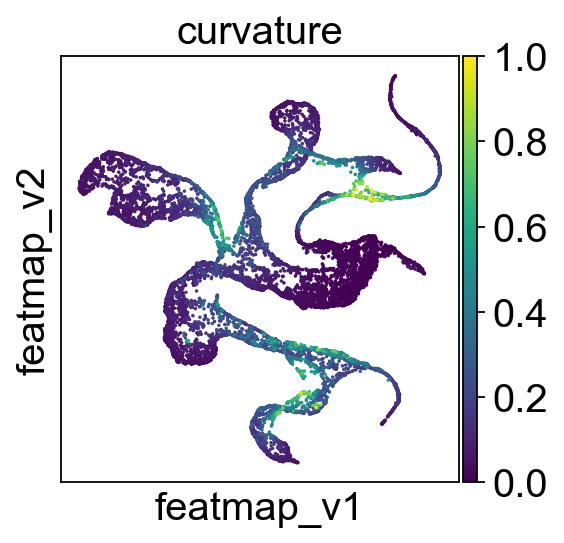

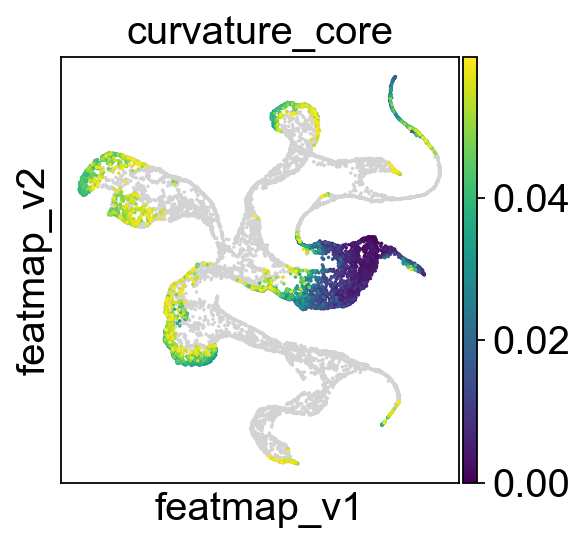

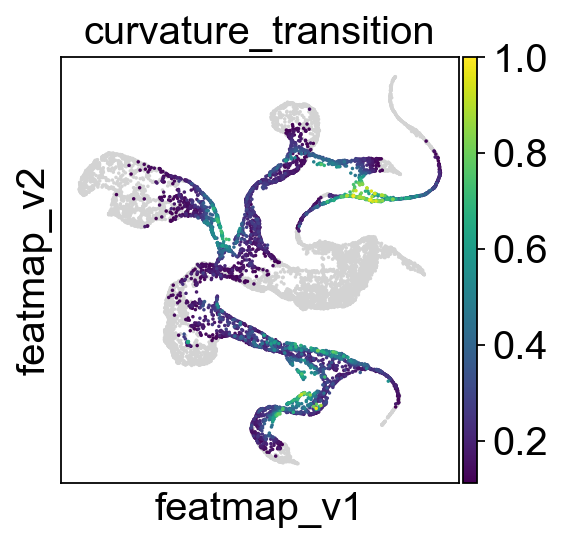

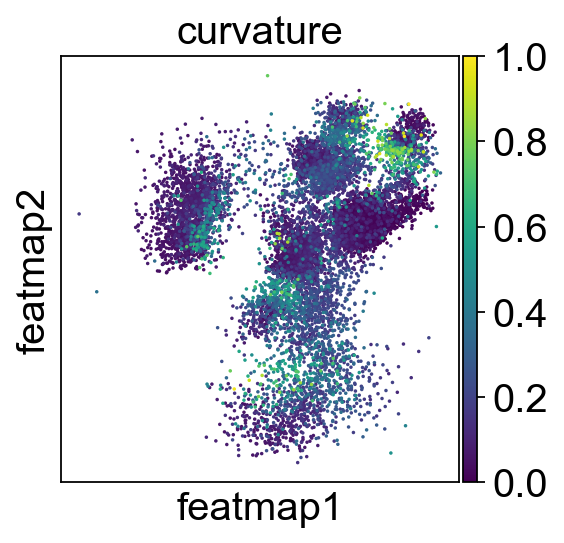

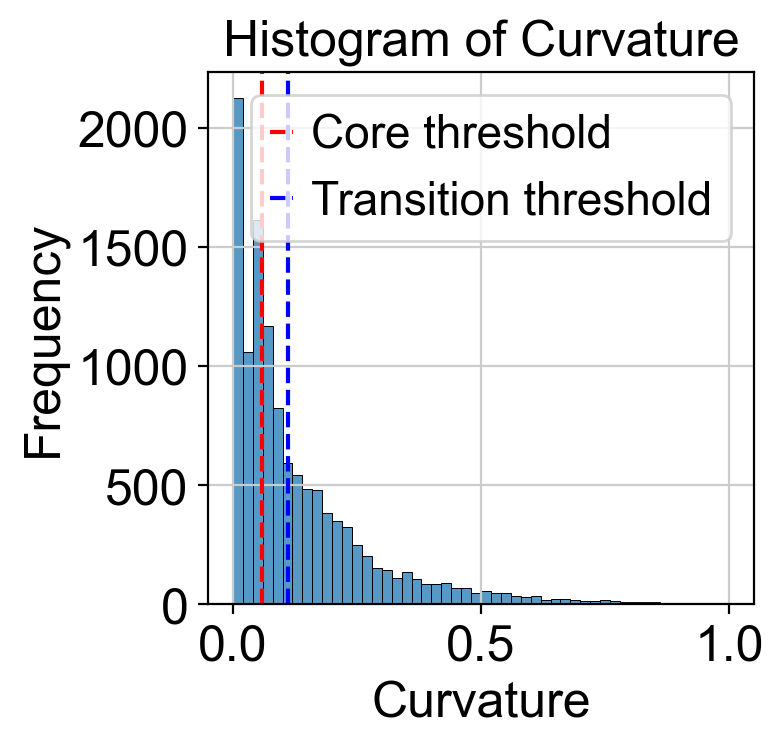

In [222]:
from featuremap import core_transition_states
import importlib
importlib.reload(core_transition_states)

quantile_core = 0.4
quantile_trans = 0.6
core_transition_states.compute_curvature(adata, emb_featuremap, quantile_core=quantile_core, quantile_trans=quantile_trans)

sc.pl.embedding(adata, 'featmap',legend_fontsize=6, s=10, legend_loc='on data', color='curvature')

# plot histogram of curvature
import seaborn as sns
import matplotlib.pyplot as plt

curvature = adata.obs['curvature']

plt.figure(dpi=100)
sns.histplot(curvature, bins=50)
plt.xlabel('Curvature')
plt.ylabel('Frequency')
plt.title('Histogram of Curvature')
threshold_core = curvature.quantile(quantile_core)
plt.axvline(threshold_core, color='red', linestyle='--', label=f'Core threshold')

threshold_trans = curvature.quantile(quantile_trans)
plt.axvline(threshold_trans, color='blue', linestyle='--', label=f'Transition threshold')
plt.legend()

plt.show()


Define transition and core states by betweenness centrality.

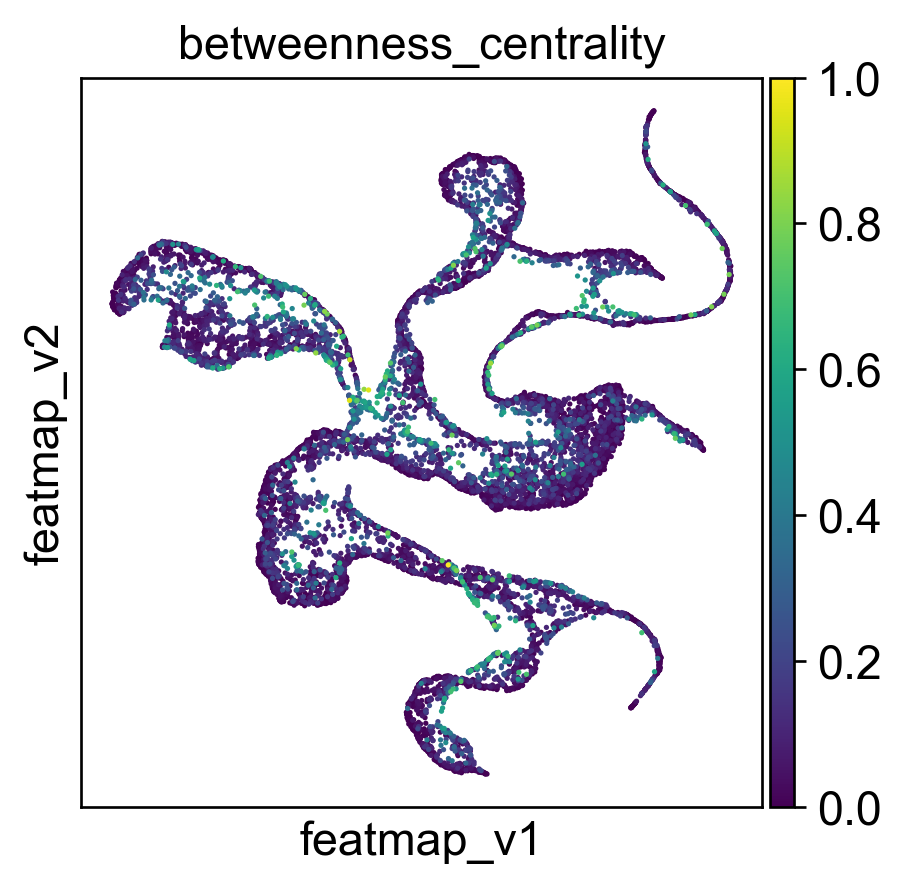

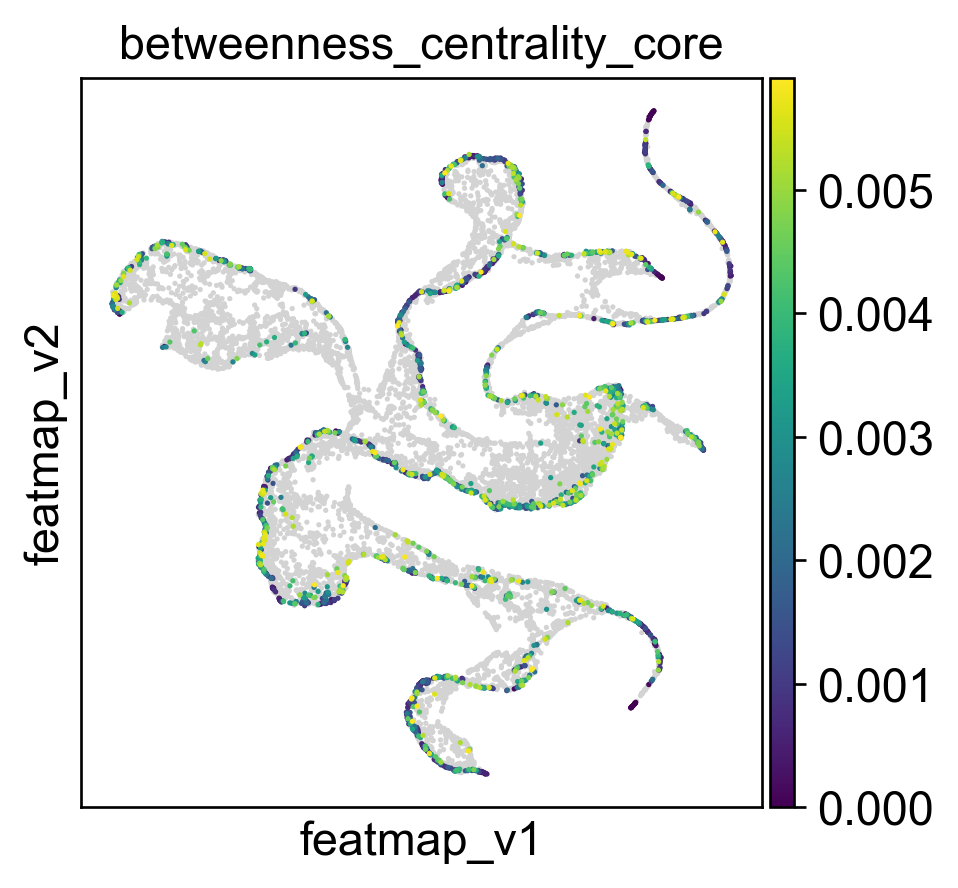

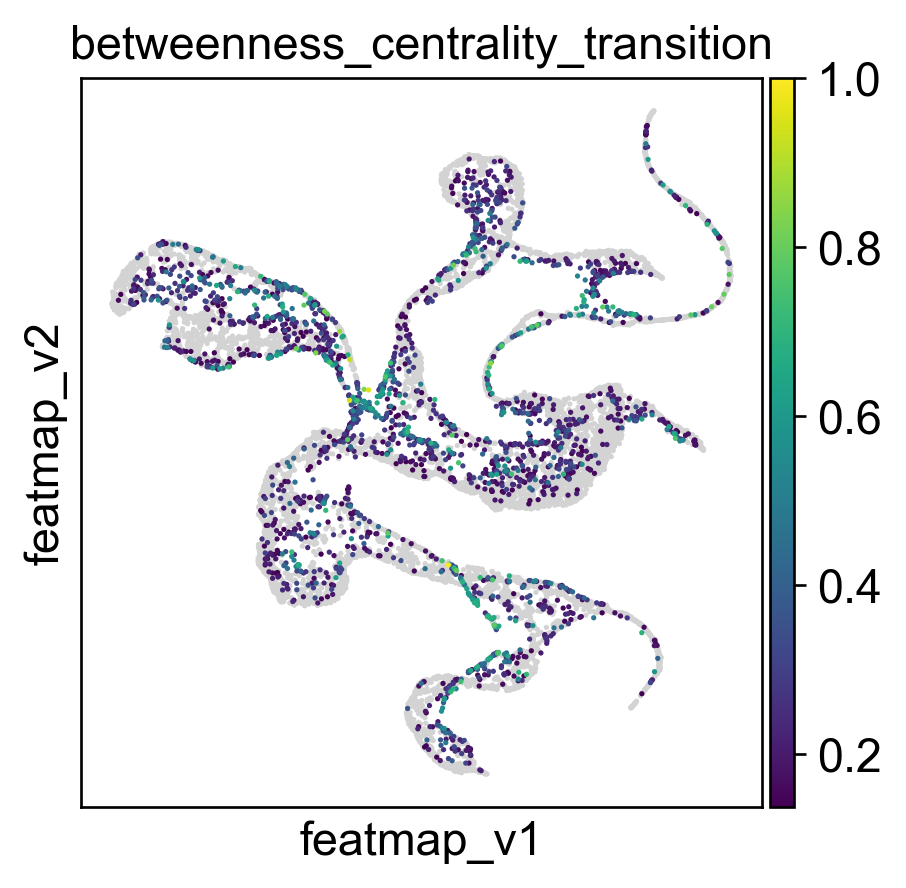

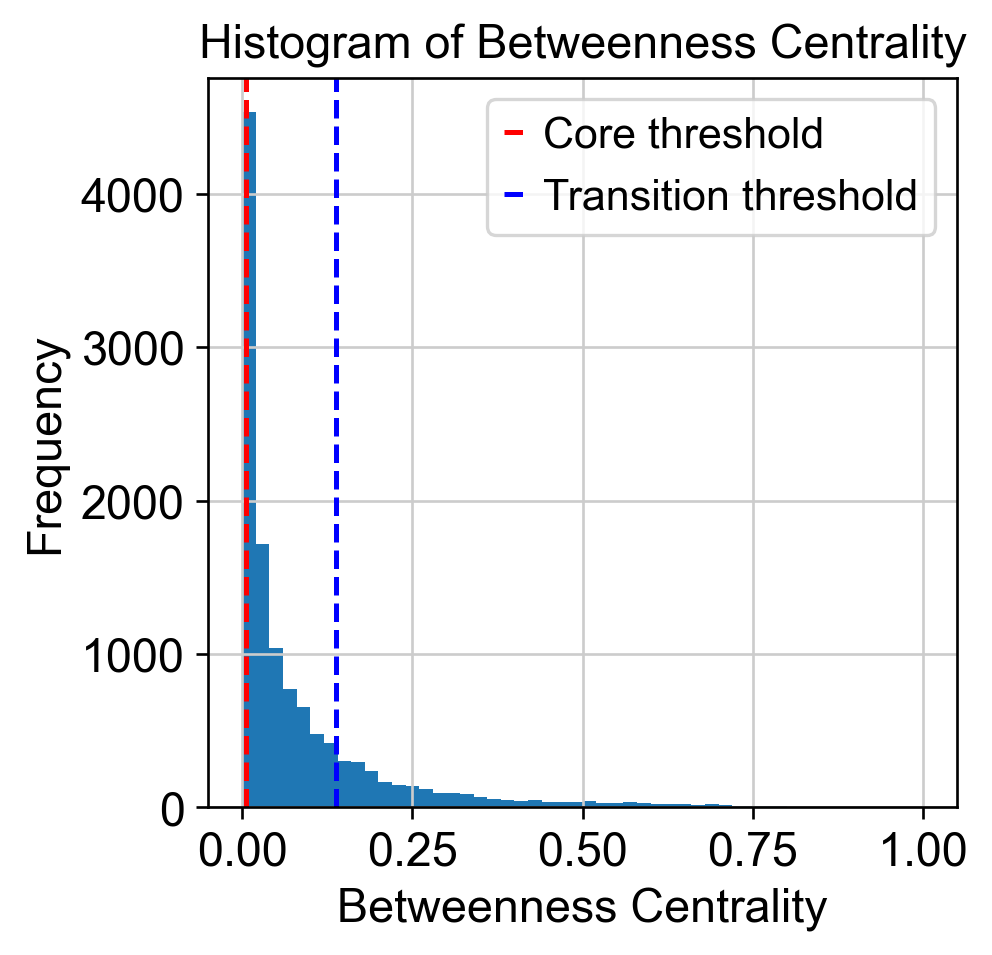

In [14]:
from featuremap import core_transition_states
import importlib
importlib.reload(core_transition_states)

quantile_trans = 0.8
quantile_core = 0.2


core_transition_states.compute_betweenness_centrality(adata, emb_featuremap, quantile_core=quantile_core, quantile_trans=quantile_trans)

betweenness_centrality = adata.obs['betweenness_centrality'].copy()
plt.hist(betweenness_centrality, bins=50)

threshold_core = betweenness_centrality.quantile(quantile_core)
plt.axvline(threshold_core, color='red', linestyle='--', label=f'Core threshold')

threshold_trans = betweenness_centrality.quantile(quantile_trans)
plt.axvline(threshold_trans, color='blue', linestyle='--', label=f'Transition threshold')  
plt.legend()

plt.xlabel('Betweenness Centrality')
plt.ylabel('Frequency')
plt.title('Histogram of Betweenness Centrality')

plt.show()

In [15]:
import anndata as ad
adata_var = ad.AnnData(X=adata.obsm['variation_pc'], obs=adata.obs)
adata_var.obsm['X_featmap_v'] = adata.obsm['X_featmap_v']
# adata_var.obs['clusters'] = adata.obs['clusters']

# leiiden clustering on variation embedding
sc.pp.pca(adata_var)
sc.pp.neighbors(adata_var, n_neighbors=5,)
sc.tl.leiden(adata_var, resolution=0.5)

adata.obs['leiden_v'] = adata_var.obs['leiden']


Visualize the transition and core states by density, curvature and betweenness centrality.

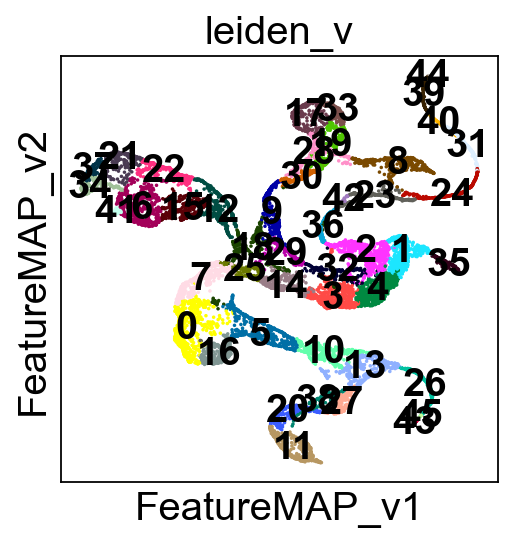

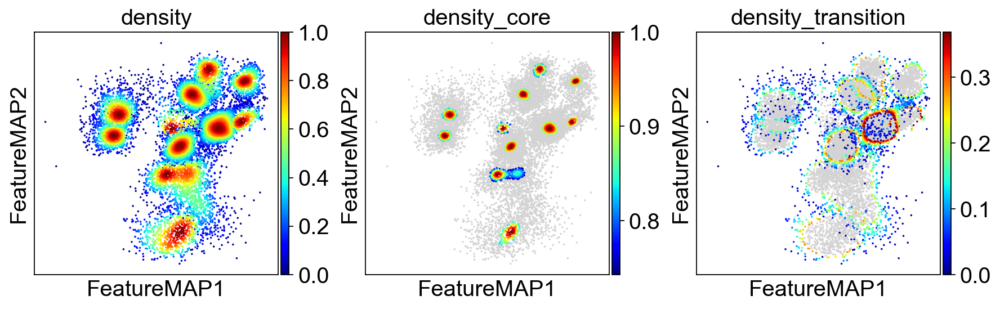

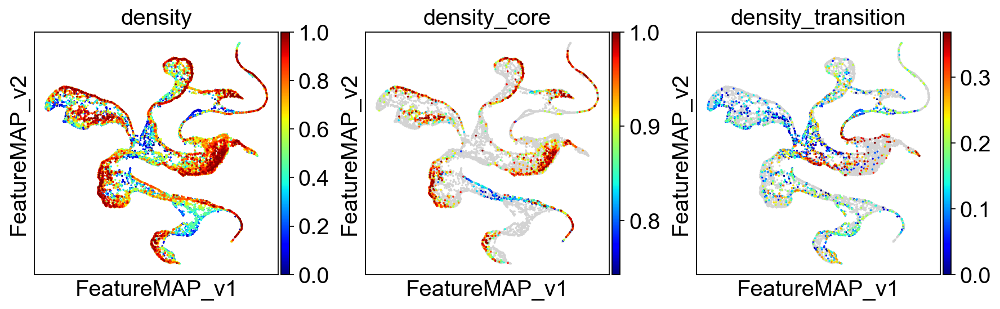

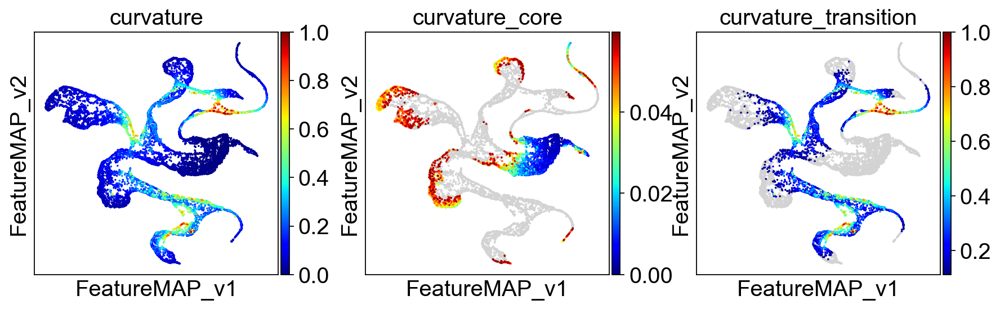

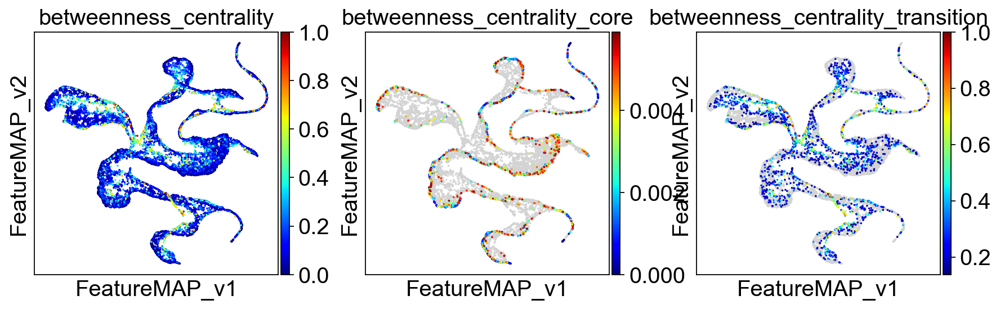

In [223]:

adata.obsm['X_FeatureMAP'] = adata.obsm['X_featmap']
adata.obsm['X_FeatureMAP_v'] = adata.obsm['X_featmap_v']

sc.set_figure_params(figsize=(3.5, 3.5),fontsize=18)

sc.pl.embedding(adata, basis='FeatureMAP_v', color='leiden_v', cmap='viridis',  legend_loc='on data',)

sc.pl.embedding(adata, basis='FeatureMAP', color=['density', 'density_core', 'density_transition'], cmap='jet',)
sc.pl.embedding(adata, basis='FeatureMAP_v', color=['curvature', 'curvature_core', 'curvature_transition'], cmap='jet', )
sc.pl.embedding(adata, basis='FeatureMAP_v', color=['betweenness_centrality', 'betweenness_centrality_core', 'betweenness_centrality_transition'], 
                cmap='jet',)


Union transition and core states results.

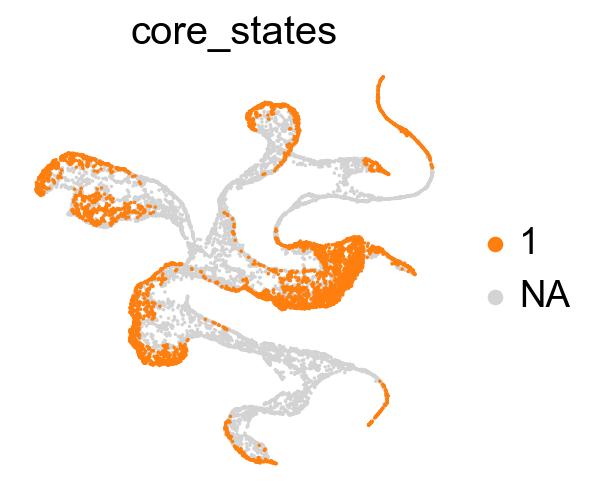

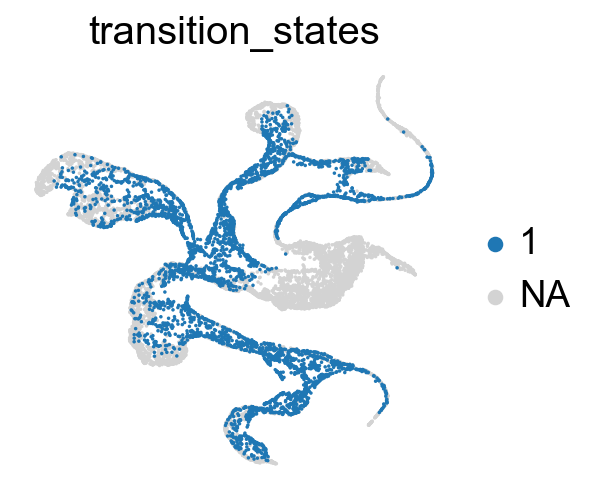

In [226]:
from featuremap import core_transition_states

import importlib
importlib.reload(core_transition_states)

core_transition_states.plot_core_transition_states(adata)

Compute the cluster state labels based on the percentage of core_states and transition_states for each cluster.


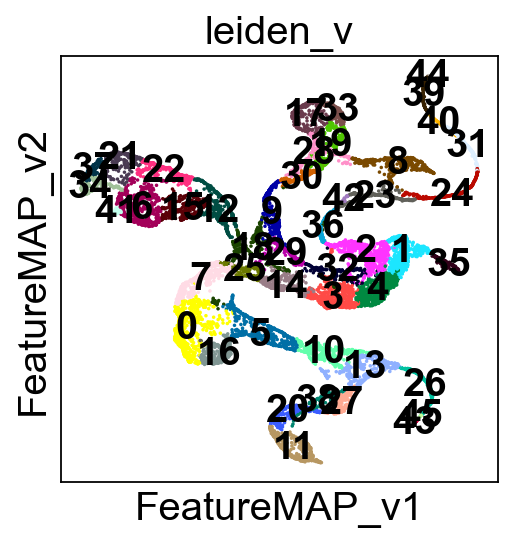

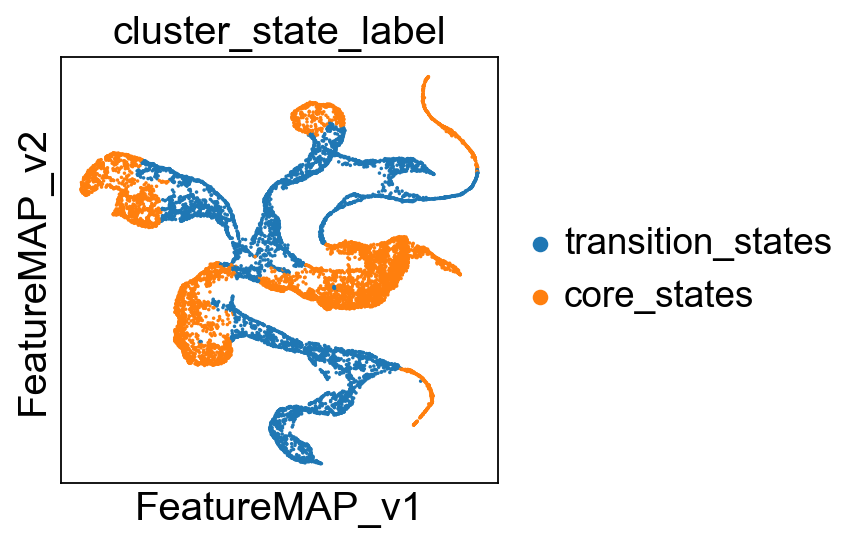

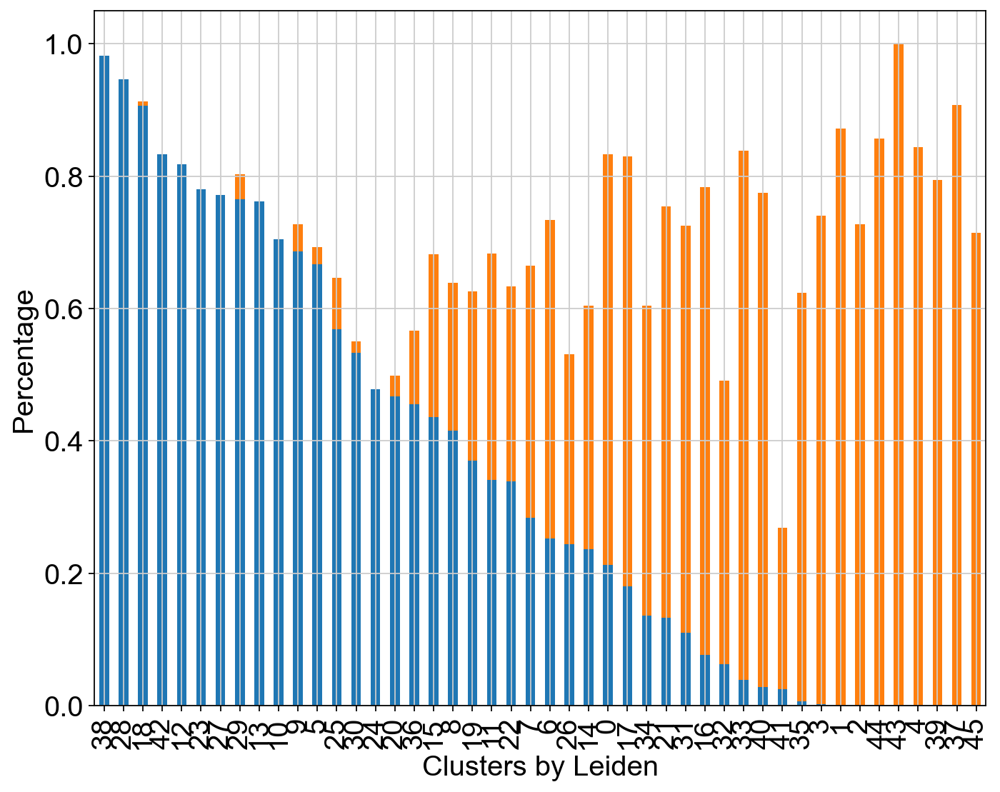

In [227]:
from featuremap import core_transition_states

import importlib
importlib.reload(core_transition_states)

# plot the leiden clustering on the variation embedding
sc.pl.embedding(adata, basis='FeatureMAP_v', color='leiden_v', legend_loc='on data')

core_transition_states.compute_cluster_state_labels(adata)

Visualize transition and core states by different methods.

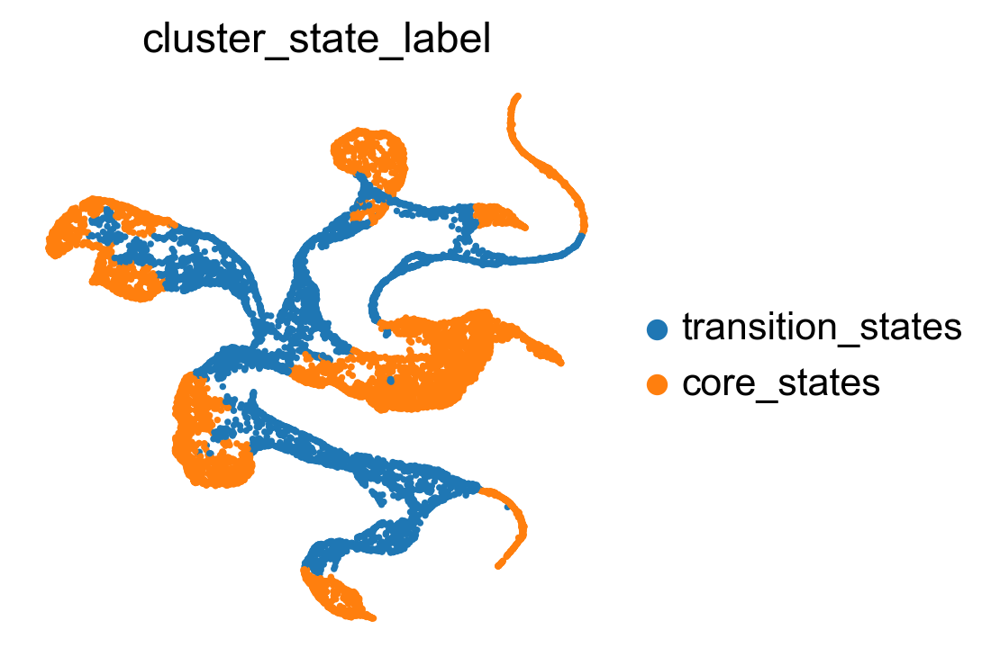

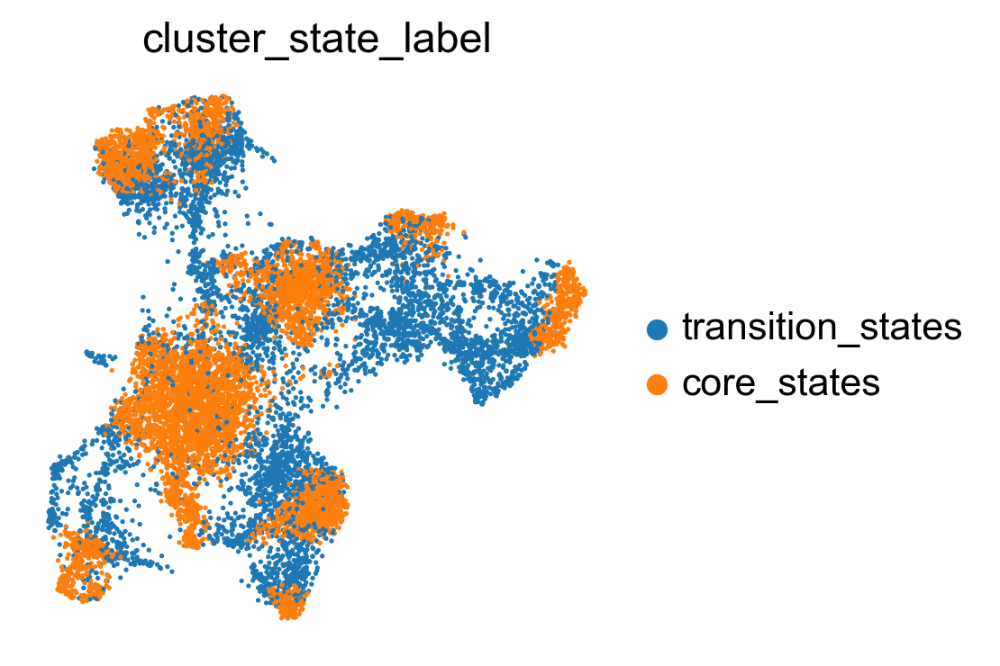

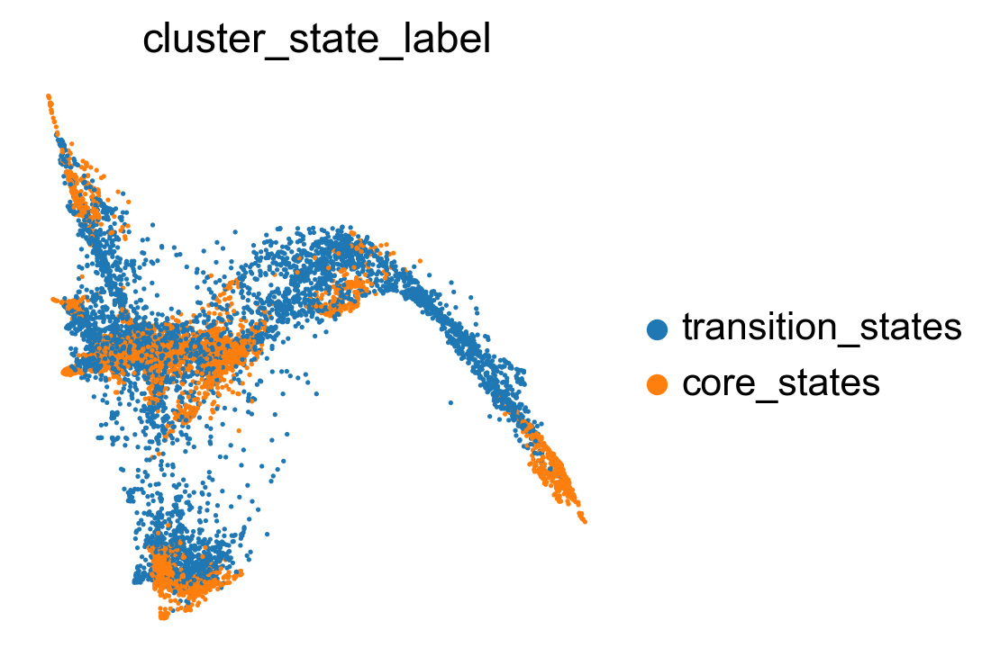

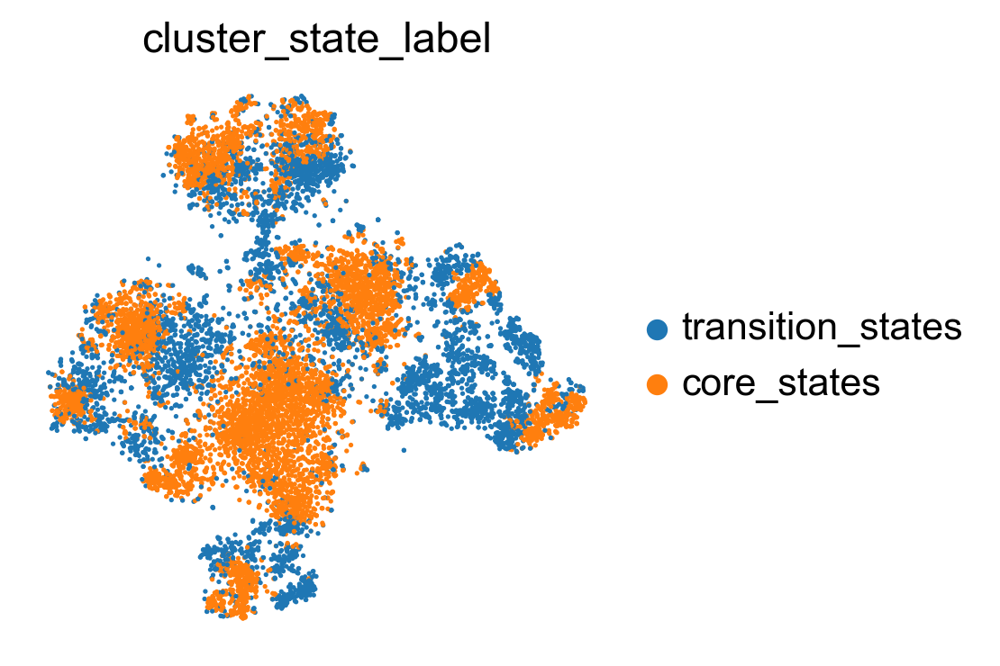

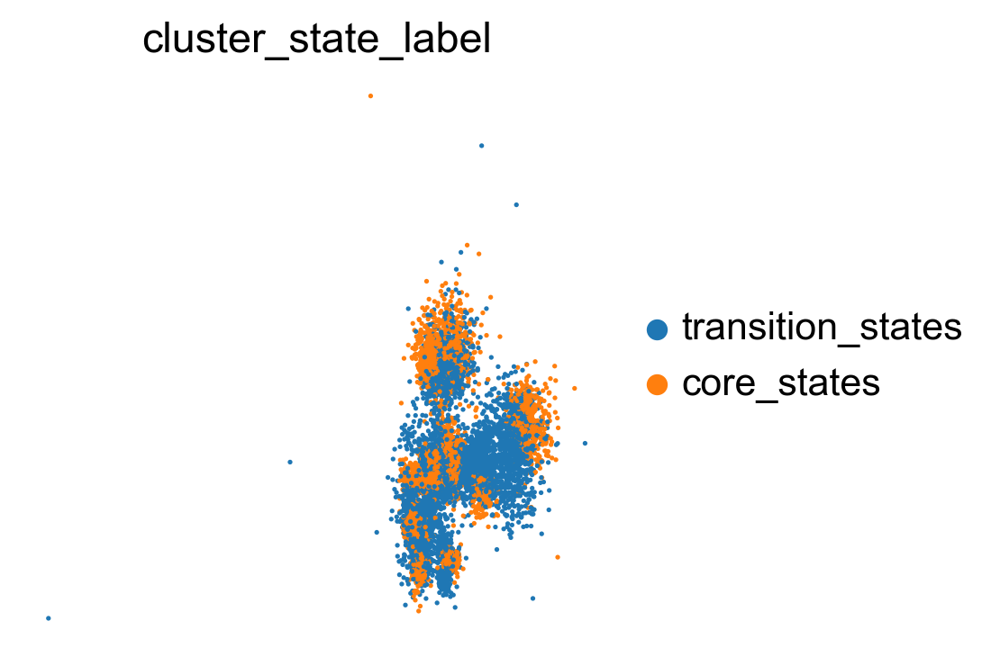

In [136]:
# sc.set_figure_params(figsize=(4, 3),dpi=100,fontsize=10)

sc.pl.embedding(adata, basis='X_featmap_v', color= ['cluster_state_label'], cmap='Blues_r', s=20, frameon=False)
sc.pl.embedding(adata, basis='X_umap', color= ['cluster_state_label'], cmap='Blues_r', s=10, frameon=False)
sc.pl.embedding(adata, basis='X_phate', color= ['cluster_state_label'], cmap='Blues_r', s=10, frameon=False)
sc.pl.embedding(adata, basis='X_tsne', color= ['cluster_state_label'], cmap='Blues_r', s=10, frameon=False)
sc.pl.embedding(adata, basis='X_densmap', color= ['cluster_state_label'], cmap='Blues_r', s=10, frameon=False)


Compare clustering coefficents of different methods to visualize the transiton  and core states.

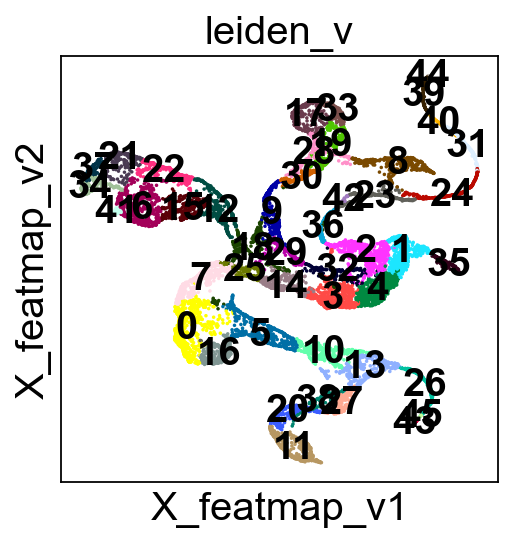

Computing the weighted clustering coefficients...
ANOVA: f_stat: 223.18077627387697, p_val: 8.007641514347437e-46


<Figure size 400x300 with 0 Axes>

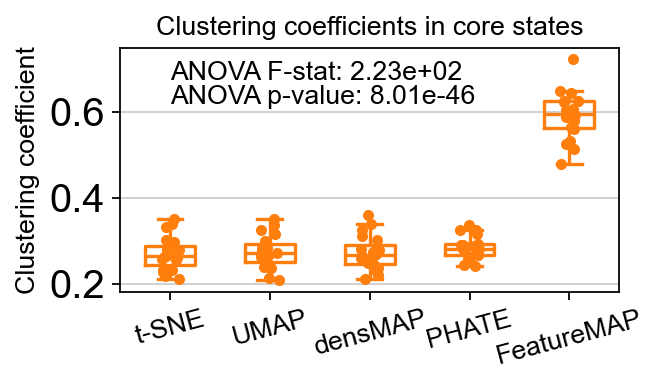

ANOVA: f_stat: 63.468286314129614, p_val: 1.195211751108129e-29


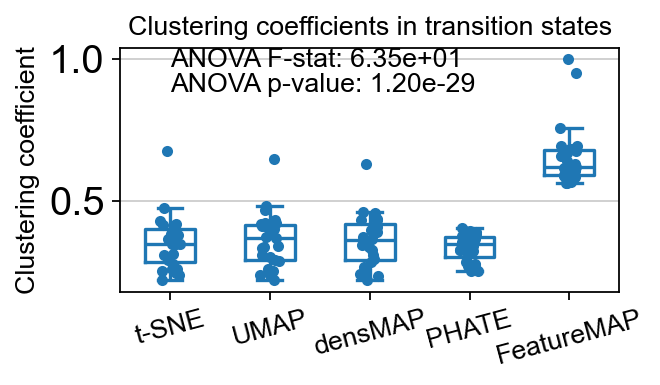

In [229]:
from featuremap import core_transition_states
import importlib
importlib.reload(core_transition_states)

core_transition_states.compute_and_plot_clustering_coefficients(adata, emb_featuremap, emb_featuremap_v, phate_graph_nx, tsne_graph, densmap_graph)


## DGV analysis

Leiden clustering on variation to visualize the core and transition states.

In [236]:
import anndata as ad
adata_var_0 = ad.AnnData(X=adata.obsm['variation_pc'], obs=adata.obs)
adata_var_0.obsm['X_featmap_v'] = adata.obsm['X_featmap_v']
adata_var_0.obs['clusters'] = adata.obs['clusters']


Leiden clustering on variation embedding.

In [237]:

sc.pp.pca(adata_var_0)
sc.pp.neighbors(adata_var_0, n_neighbors=5,)
sc.tl.leiden(adata_var_0, resolution=0.3)

adata.obs['leiden_v'] = adata_var_0.obs['leiden']


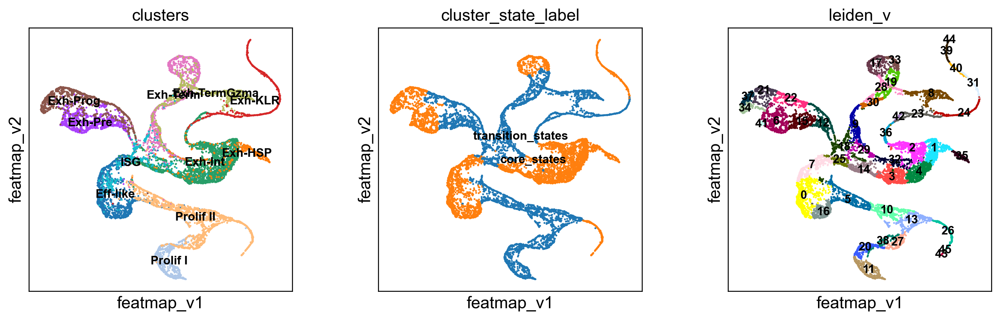

In [ ]:
#  plot the density
sc.settings.set_figure_params(dpi=120)
sc.pl.embedding(adata, 'featmap_v',legend_fontsize=10, s=10, legend_loc='on data', 
                color=['clusters','cluster_state_label','leiden_v'])

Select the path from Exh-Int to Exh-KLR by Leiden clusters.

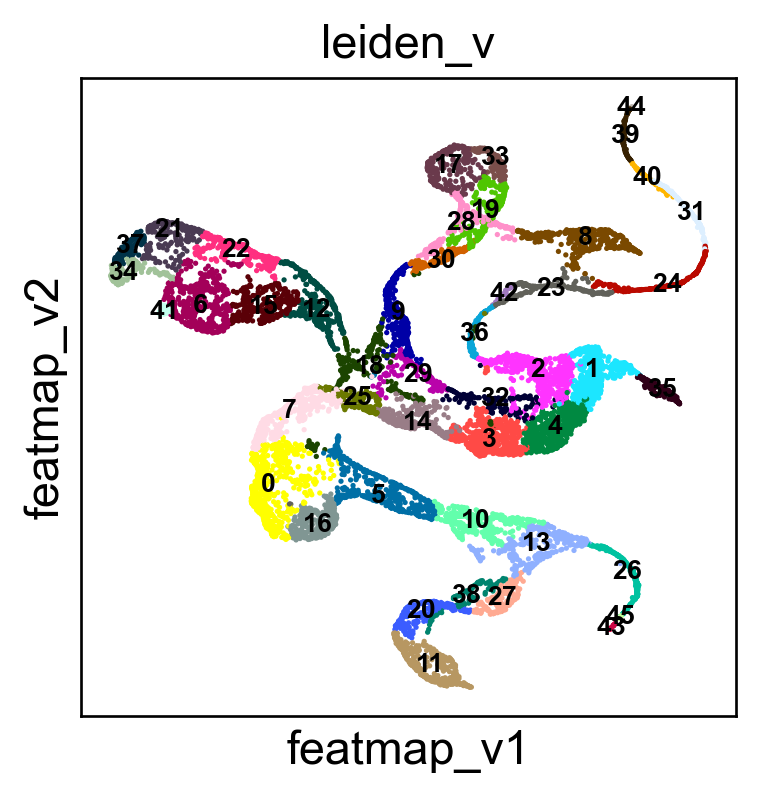

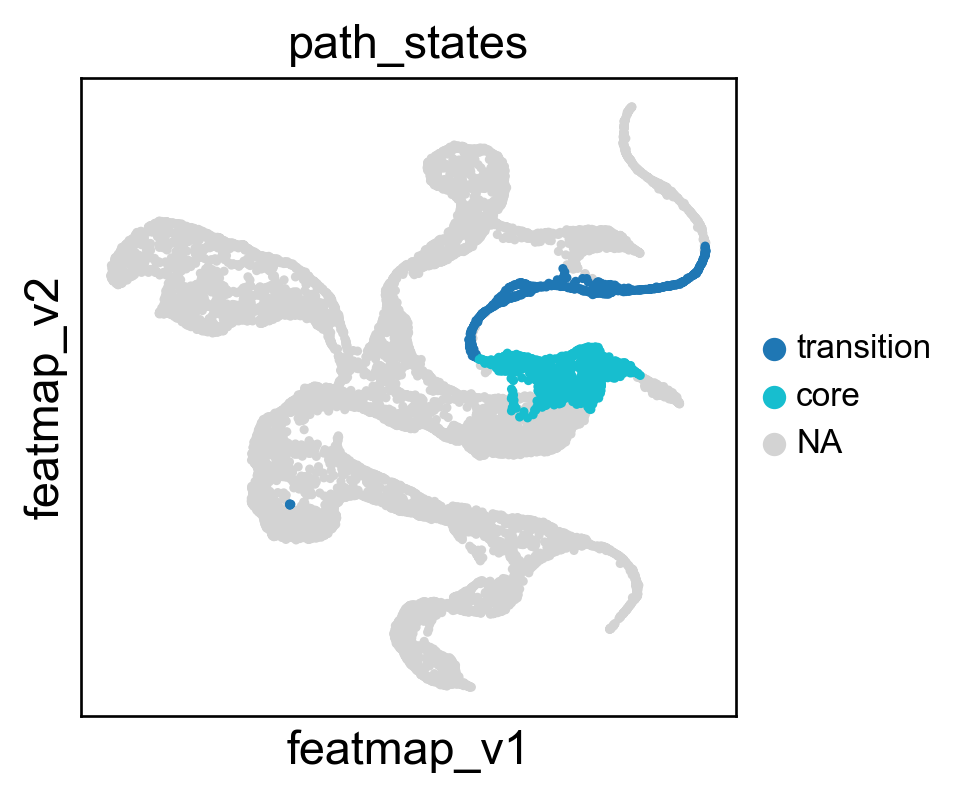

In [ ]:

# During the bifurcation, select the core states and transition states by leiiden clustering
core_states = [1,2]
transition_states = [36,42,23,24]


from featuremap import core_transition_states
import importlib
importlib.reload(core_transition_states)

# core_transition_states.bifurcation_plot(adata, core_states, transition_states_1, transition_states_2)
core_transition_states.path_plot(adata, core_states, transition_states)




Comparison the density, curvature and betweenness centrality between transtion and core states shows
significant difference.

T-test p-value for core states and transition states_1: 1.5012921717992195e-136
T-test p-value for core states and transition states_1: 1.918977936628852e-280
Average betweenness centrality of core states: 0.06315732422093487
Average betweenness centrality of transition states_1: 0.08555888595291018
T-test p-value for core states and transition states_1: 0.00019760886413654004


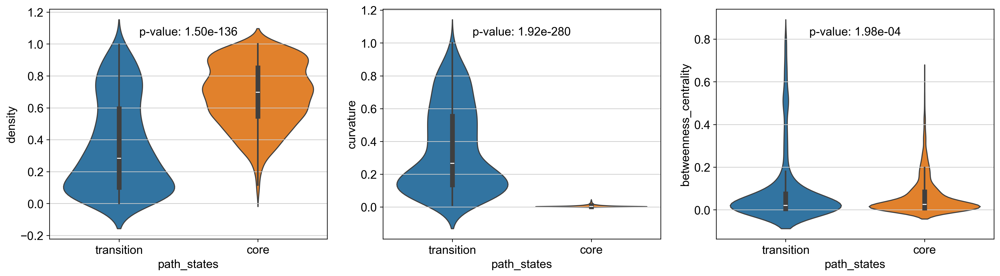

In [244]:

# violin plot to show the density, curevature and betweeness centrality of core states and transition states
from scipy import stats
# t-test for the density of core states and transition states_1
p_val_density = stats.ttest_ind(adata.obs[adata.obs['path_states']=='core']['density'],
                adata.obs[adata.obs['path_states']=='transition']['density'])[1]
print(f'T-test p-value for core states and transition states_1: {p_val_density}')


# t-test for the curvature of core states and transition states_1
p_val_curvature = stats.ttest_ind(adata.obs[adata.obs['path_states']=='core']['curvature'],
                adata.obs[adata.obs['path_states']=='transition']['curvature'])[1]
print(f'T-test p-value for core states and transition states_1: {p_val_curvature}')

# t-test for the betweenness centrality of core states and transition states_1
# average betweenness centrality of the core states and transition states_1

average_bc_core = adata.obs[adata.obs['path_states']=='core']['betweenness_centrality'].mean()
average_bc_transition = adata.obs[adata.obs['path_states']=='transition']['betweenness_centrality'].mean()
print(f'Average betweenness centrality of core states: {average_bc_core}')
print(f'Average betweenness centrality of transition states_1: {average_bc_transition}')

p_val_bc = stats.ttest_ind(adata.obs[adata.obs['path_states']=='core']['betweenness_centrality'],
                adata.obs[adata.obs['path_states']=='transition']['betweenness_centrality'])[1]
print(f'T-test p-value for core states and transition states_1: {p_val_bc}')


# plot the p_value in the violin plot
import seaborn as sns
import matplotlib.pyplot as plt
fig, ax = plt.subplots(1, 3, figsize=(20, 5))
sns.violinplot(x='path_states', y='density', data=adata.obs, ax=ax[0], hue='path_states')
sns.violinplot(x='path_states', y='curvature', data=adata.obs, ax=ax[1], hue='path_states')
sns.violinplot(x='path_states', y='betweenness_centrality', data=adata.obs, ax=ax[2], hue='path_states')

# add p-value to the plot
ax[0].text(0.5, 0.9, f'p-value: {p_val_density:.2e}', horizontalalignment='center', verticalalignment='center', transform=ax[0].transAxes)
ax[1].text(0.5, 0.9, f'p-value: {p_val_curvature:.2e}', horizontalalignment='center', verticalalignment='center', transform=ax[1].transAxes)
ax[2].text(0.5, 0.9, f'p-value: {p_val_bc:.2e}', horizontalalignment='center', verticalalignment='center', transform=ax[2].transAxes)

# remove legend
ax[0].get_legend().remove()
ax[1].get_legend().remove()
ax[2].get_legend().remove()

plt.show()

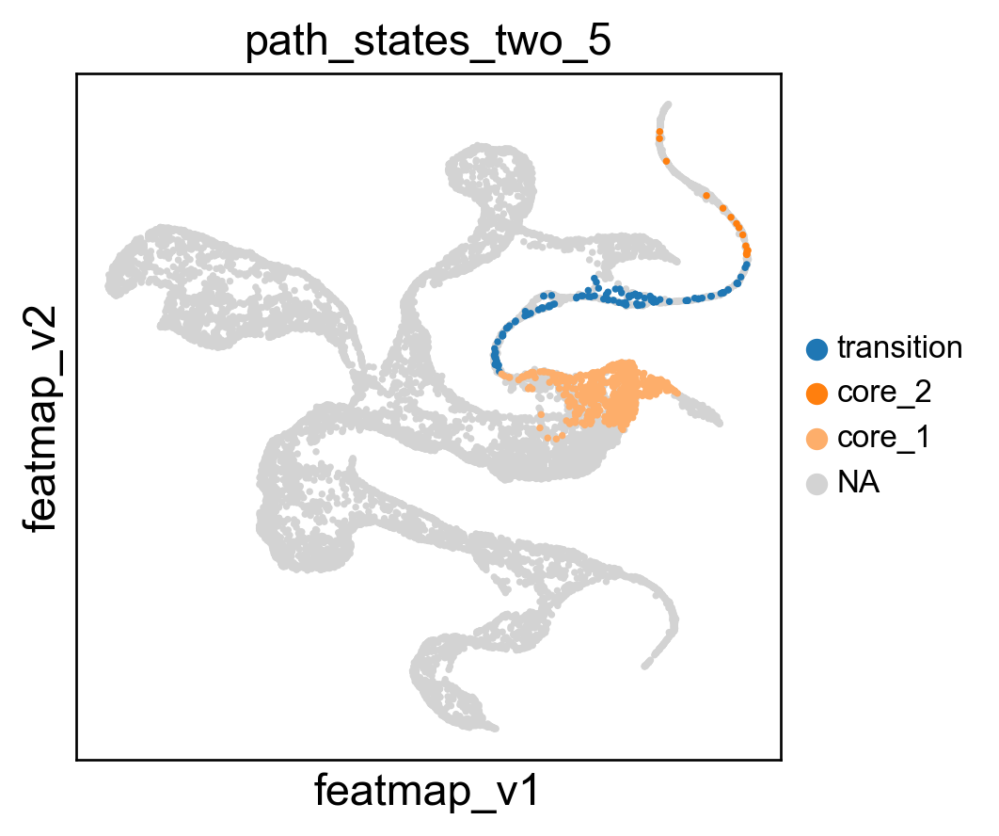

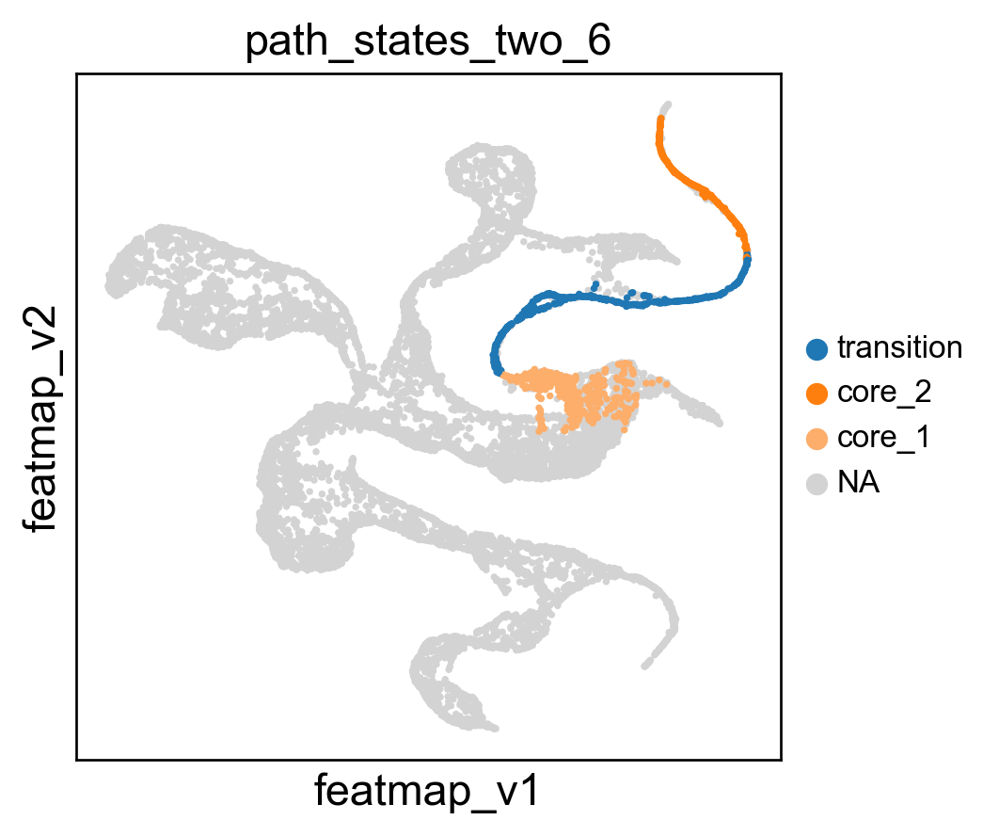

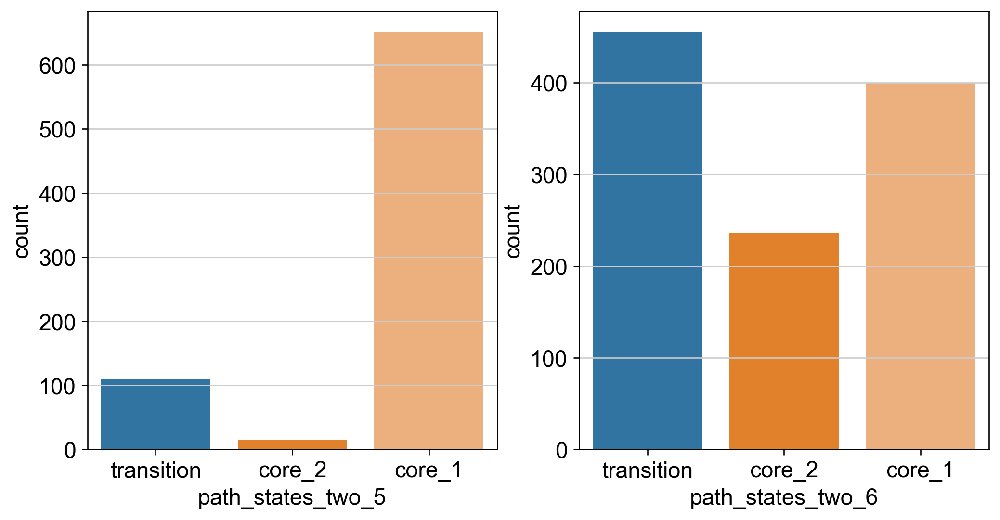

In [247]:
core_states_1 = [1,2]
transition_states_1 = [36,42,23,24]
core_states_2 = [31,40,39,44]

core_states_map_1 = {str(i):'core_1' for i in core_states_1}
transition_states_map = {str(i):'transition' for i in transition_states}
core_states_map_2 = {str(i):'core_2' for i in core_states_2}

# merge the core states and transition states
path_state = {**core_states_map_1, **transition_states_map, **core_states_map_2}
# path_state = {**core_states_map, **transition_states_map}

adata.obs['path_states_two'] = adata.obs['leiden_v'].map(path_state)
adata.obs['path_states_two']  = adata.obs['path_states_two'].astype('category')

adata.obs['path_states_two']  = adata.obs['path_states_two'].cat.set_categories(['transition',  'core_2', 'core_1',], ordered=True)


# get index of time == '5'
time_5 = adata.obs[adata.obs['time'] == '5'].index

# get the index time == '6'
time_6 = adata.obs[adata.obs['time'] == '6'].index

# subset path_states_two with time == '5'
path_states_two_5 = adata.obs['path_states_two'].loc[time_5]
# create a new column with time == '5' and path_states_two
adata.obs['path_states_two_5'] = path_states_two_5

# subset path_states_two with time == '6'
path_states_two_6 = adata.obs['path_states_two'].loc[time_6]   
# create a new column with time == '6' and path_states_two
adata.obs['path_states_two_6'] = path_states_two_6


# sc.pl.embedding(adata, 'featmap_v',legend_fontsize=10, s=30, color=['path_states_two'])

import matplotlib.pyplot as plt

# Create a colour palette using the requested colours
tab10_0 = plt.cm.tab10(0)
tab10_1 = plt.cm.tab10(1)
tab20c_6 = plt.cm.tab20c(6)

# Combine the colours into a palette
palette = [tab10_0, tab10_1, tab20c_6]

sc.pl.embedding(adata, 'featmap_v',legend_fontsize=10, s=20, color=['path_states_two_5'], palette =palette)
sc.pl.embedding(adata, 'featmap_v',legend_fontsize=10, s=20, color=['path_states_two_6'], palette =palette)


# Bar plot to show the proportion of core states and transition states at time == '5' and time == '6'
import seaborn as sns
import matplotlib.pyplot as plt

fig, ax = plt.subplots(1, 2, figsize=(10, 5))
sns.countplot(x='path_states_two_5', data=adata.obs, ax=ax[0], palette=palette)
sns.countplot(x='path_states_two_6', data=adata.obs, ax=ax[1], palette=palette)

plt.show()




Differential Gene Variation Analysis

DPT pseudotime.

In [128]:
# set the root cell
sc.pp.neighbors(adata, n_neighbors=15)
sc.tl.diffmap(adata)
adata.uns['iroot'] = np.where(adata.obs['clusters'] == 'Prolif I')[0][0]
sc.tl.dpt(adata)

         Falling back to preprocessing with `sc.pp.pca` and default params.


Compute the gene variation for each gene and preprocess the gene variation for DGV analysis.

In [ ]:
from featuremap.features import feature_variation, variation_feature_pp
# Get the variation of each feature
feature_variation(adata, threshold=0.9)

# Preprocess the feature variation 
adata_var = variation_feature_pp(adata)
adata.layers['variation_feature_processed'] = adata_var.layers['var_filter'].copy()


k is 13
Start matrix multiplication
Finish matrix multiplication in 252.66686177253723
Finish norm calculation in 207.10100412368774


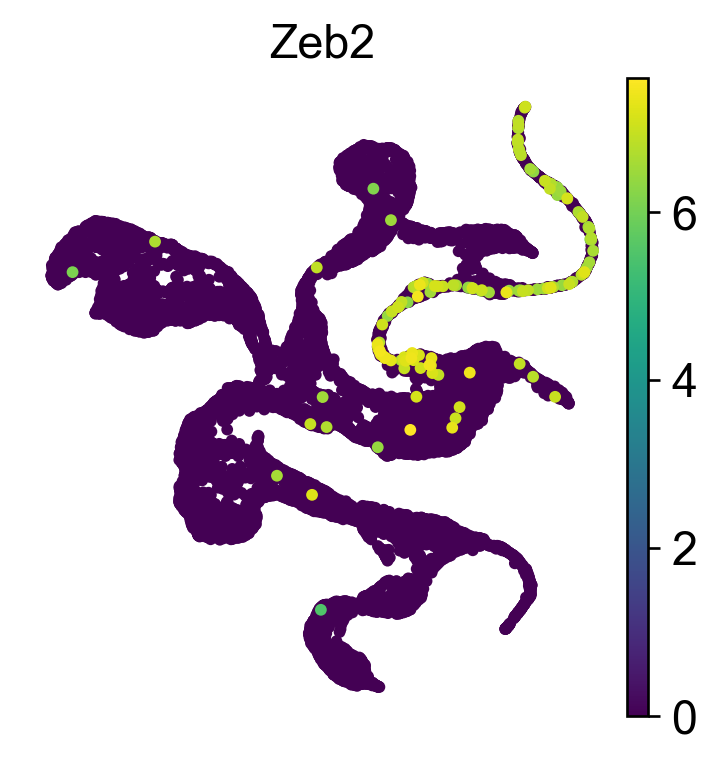

In [131]:
sc.set_figure_params(dpi=120, figsize=(3.5, 3.5))
sc.pl.embedding(adata, 'featmap_v' ,color='Zeb2', s=50, layer='variation_feature_processed', frameon=False)


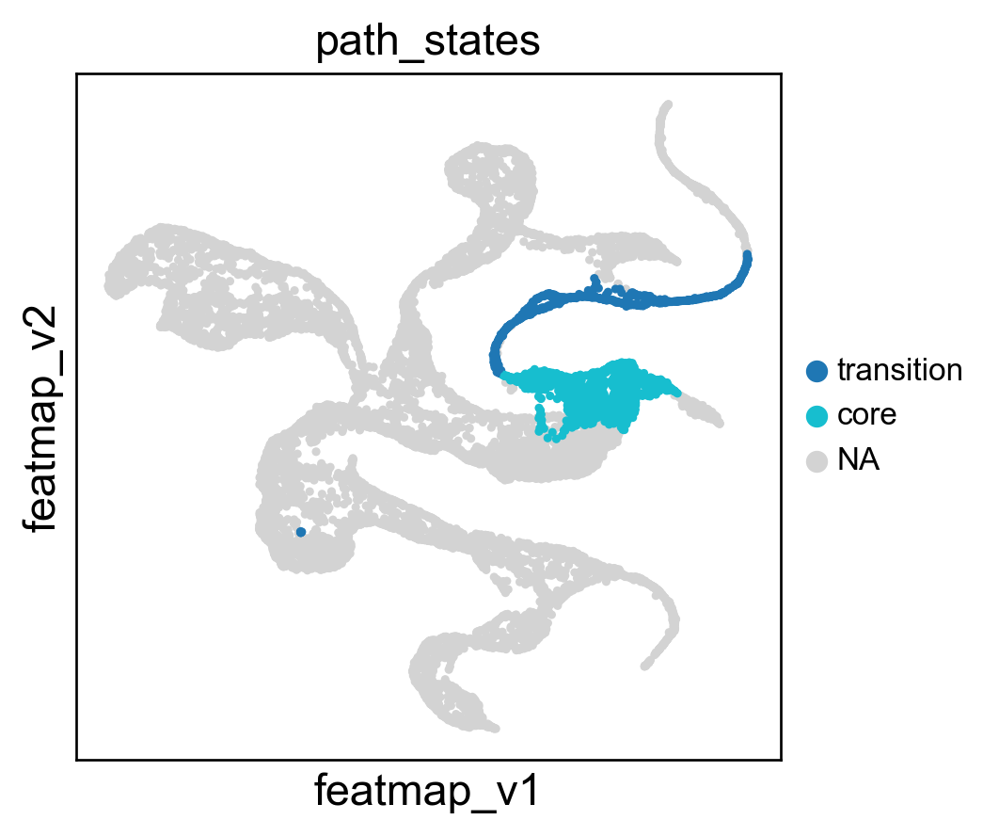

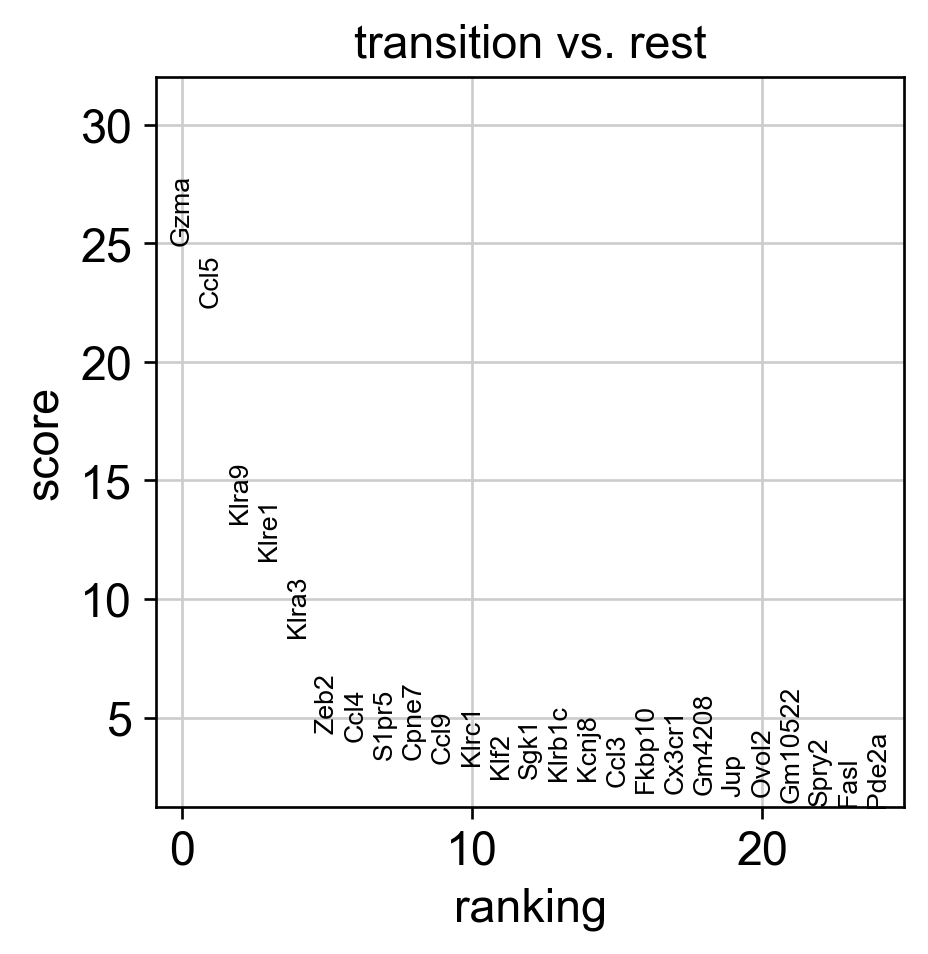

In [249]:
import importlib
importlib.reload(features)

# During the bifurcation, select the core states and transition states by leiiden clustering
core_states = [1,2]
transition_states = [36,42,23,24]
# transition_states_2 = [14, 17, 8]

from featuremap import core_transition_states
import importlib
importlib.reload(core_transition_states)
# plot the path
core_transition_states.path_plot(adata, core_states, transition_states)


# run DGV analysis 
sc.tl.rank_genes_groups(adata, 'path_states', groups=['transition'], method='wilcoxon', use_raw=False, layer='variation_feature_processed')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)


Visualize gene Zeb2 by gene expression, gene variation and gene projection.

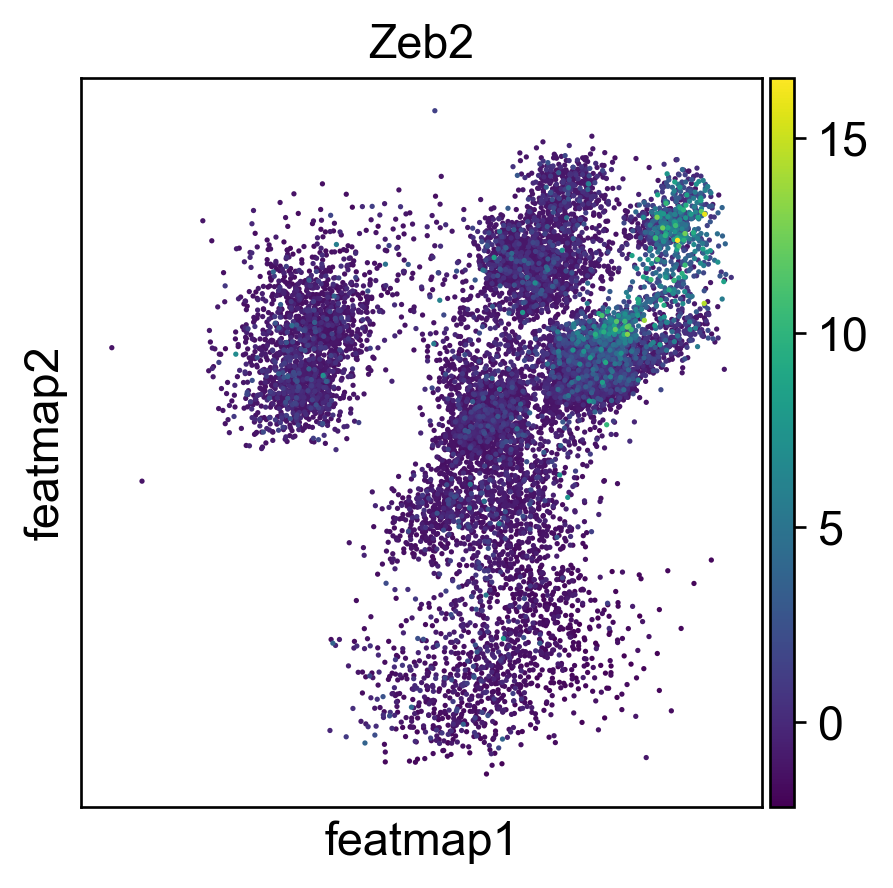

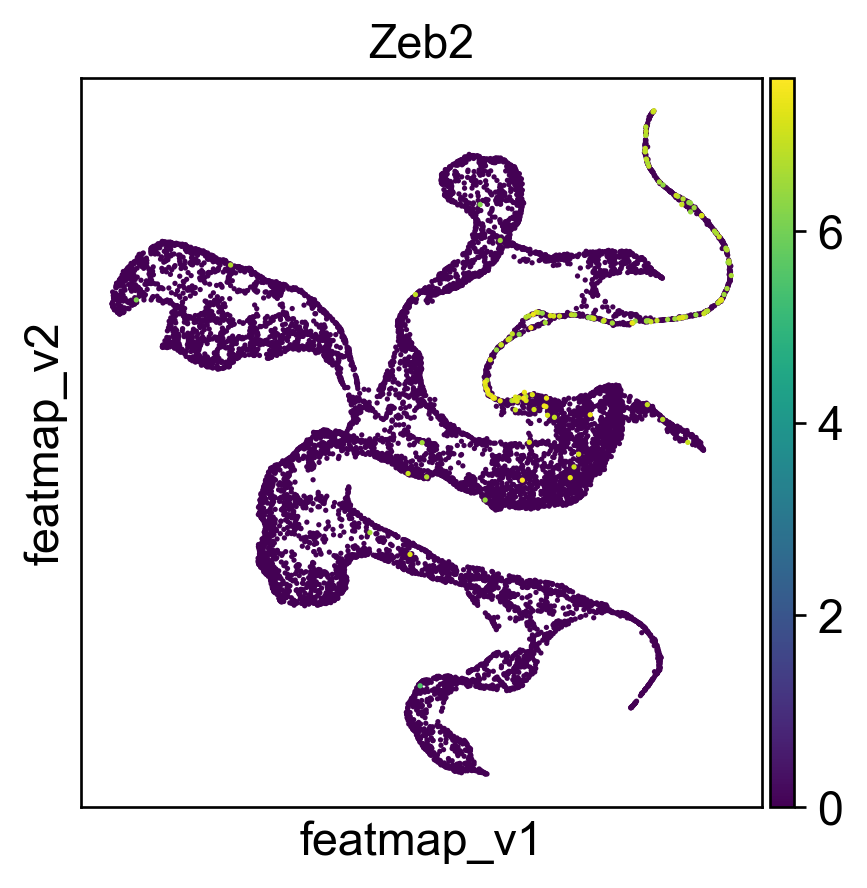

Rank of Zeb2 is  [5] in transition
Start matrix multiplication
Finish matrix multiplication in 0.24089789390563965
pcVals_project_back_feature: (11951, 2, 1)
gauge_vh_emb: (11951, 2, 2)


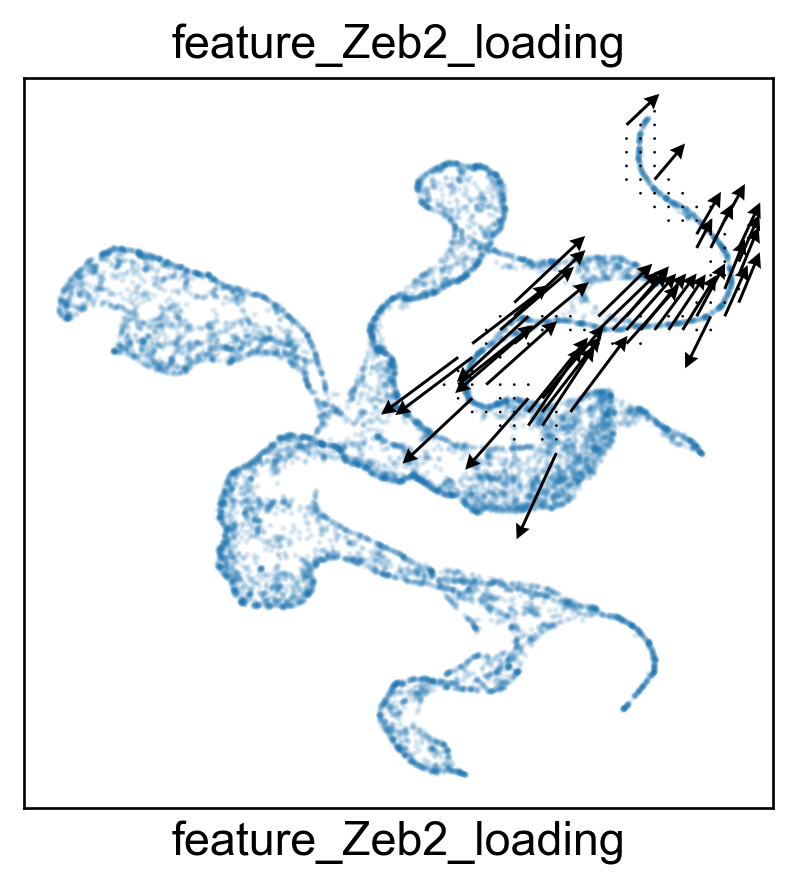

In [250]:
gene = 'Zeb2'
sc.pl.embedding(adata, 'featmap' ,color=[gene],)
sc.pl.embedding(adata, 'featmap_v' ,color=[gene],layer='variation_feature_processed')
rank = np.where(adata.uns['rank_genes_groups']['names']['transition'] == gene)[0]
print(f'Rank of {gene} is  {rank} in transition')

features.feature_projection(adata, feature=gene)
features.plot_one_feature(adata, feature=gene, ratio=0.1, density=1, embedding='X_featmap_v',
                               pseudotime='feat_pseudotime', pseudotime_adjusted=True, 
                               plot_within_cluster=['Exh-Int', 'Exh-KLR'],
                               )    


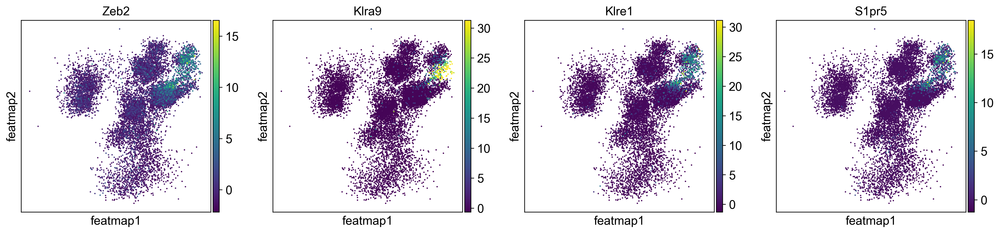

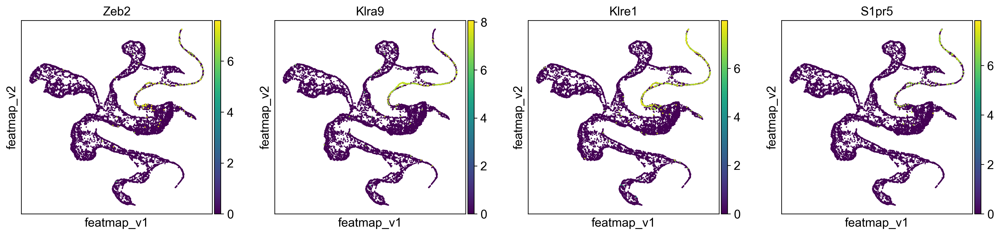

In [252]:
sc.pl.embedding(adata, 'featmap', color=['Zeb2',  'Klra9', 'Klre1','S1pr5'], s=10, legend_loc='on data',)
sc.pl.embedding(adata, 'featmap_v', color=['Zeb2', 'Klra9', 'Klre1', 'S1pr5'], s=10, legend_loc='on data',layer='variation_feature_processed', )

Start matrix multiplication
Finish matrix multiplication in 0.09004712104797363
pcVals_project_back_feature: (11951, 2, 1)
gauge_vh_emb: (11951, 2, 2)


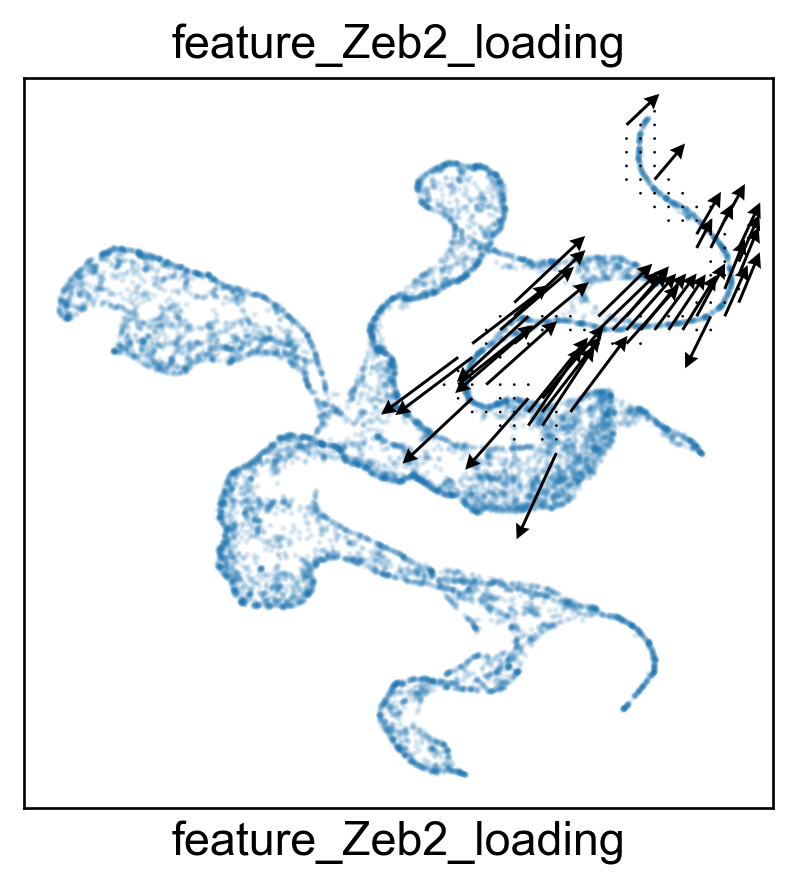

Start matrix multiplication
Finish matrix multiplication in 0.09099388122558594
pcVals_project_back_feature: (11951, 2, 1)
gauge_vh_emb: (11951, 2, 2)


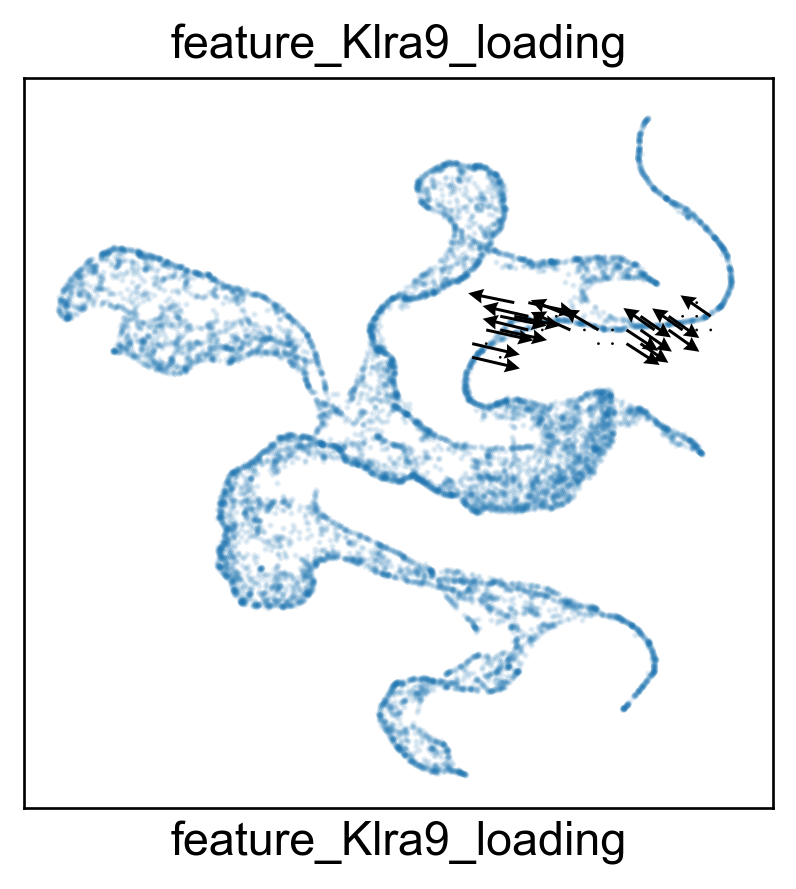

Start matrix multiplication
Finish matrix multiplication in 0.10413908958435059
pcVals_project_back_feature: (11951, 2, 1)
gauge_vh_emb: (11951, 2, 2)


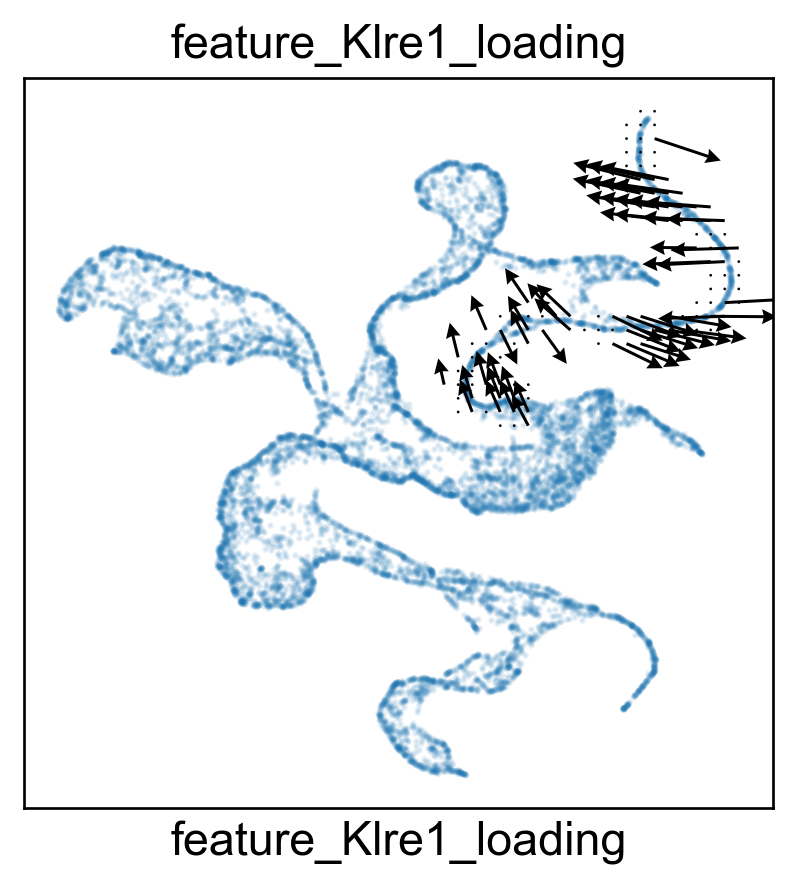

Start matrix multiplication
Finish matrix multiplication in 0.08983302116394043
pcVals_project_back_feature: (11951, 2, 1)
gauge_vh_emb: (11951, 2, 2)


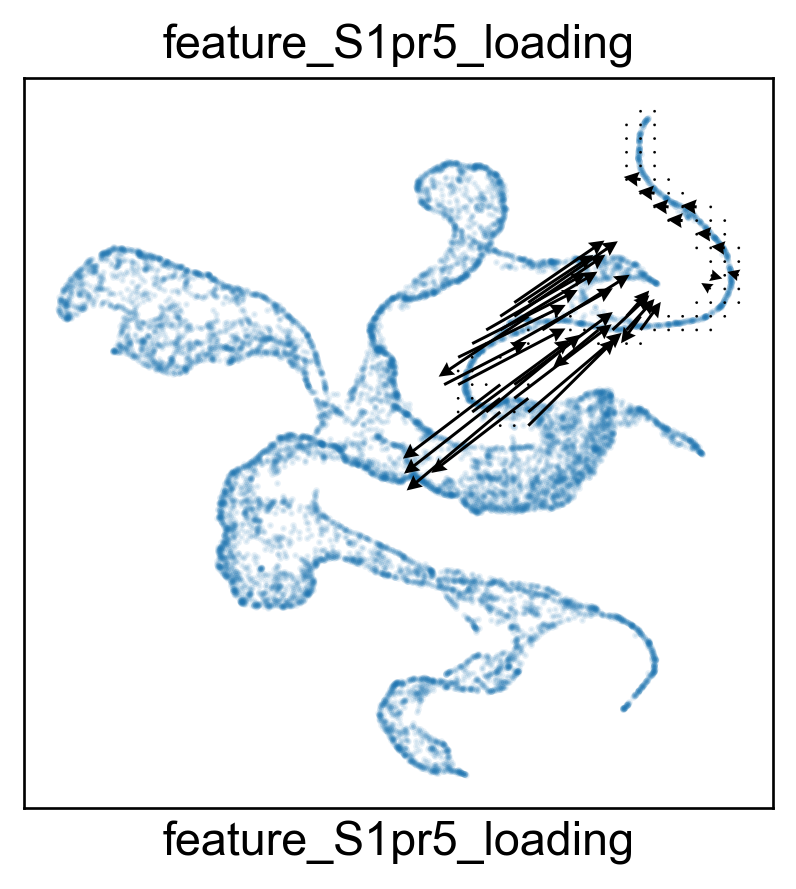

In [254]:
from featuremap import features 
import importlib

importlib.reload(features)

for gene in ['Zeb2', 'Klra9', 'Klre1', 'S1pr5']:
    features.feature_projection(adata, feature=gene)
    features.plot_one_feature(adata, feature=gene, ratio=0.1, density=1, embedding='X_featmap_v',
                               pseudotime='feat_pseudotime', pseudotime_adjusted=True, 
                               plot_within_cluster=['Exh-Int', 'Exh-KLR'],
                               )



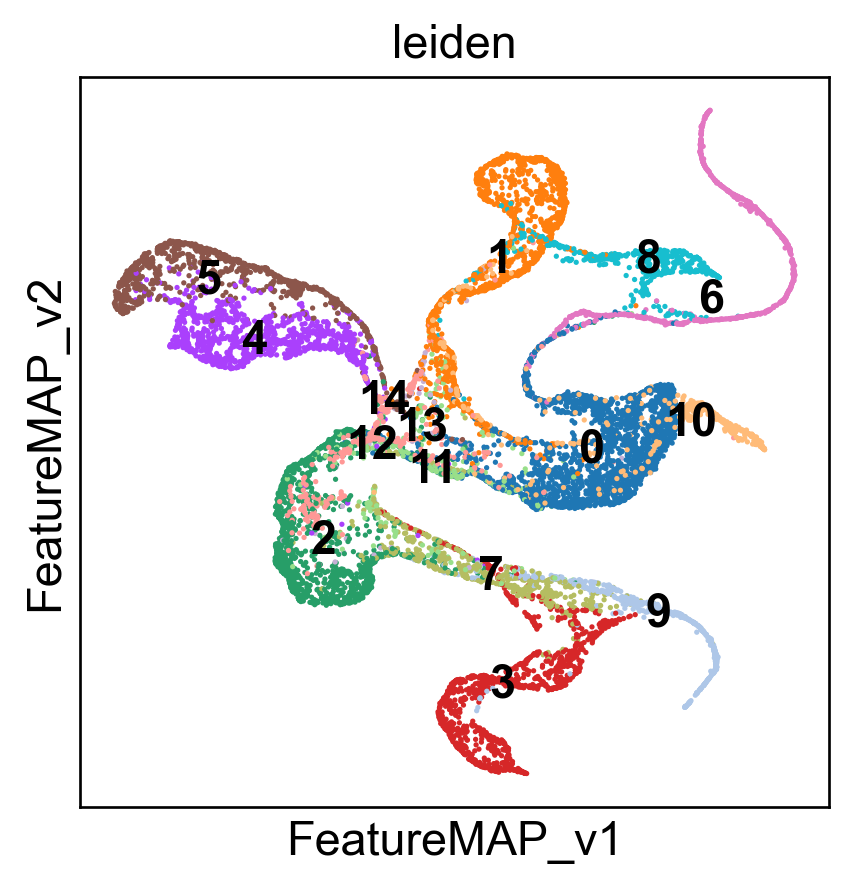

In [256]:
# Leiden clustering on the expression data

sc.pp.pca(adata)
sc.pp.neighbors(adata, n_neighbors=5,)
